In [2]:
#Importing Libraries
import saha_mult #Class used to calculate abundances 
from saha_Luke_isoelectronic import SkyNetIonization 
import numpy as np
import os
import h5py
import matplotlib.pyplot as plt
import pandas as pd
import scipy.constants as sc
from time import process_time #Useful for finding calculation times
import pickle #for saving data in lists to txt files.

import importlib 
importlib.reload(saha_mult) #This command ensures that any changes made to saha_mult class are reflected in this notebook

<module 'saha_mult' from 'C:\\Users\\prana\\Documents\\Research\\R-process_Mergers\\Abundance_Calculations\\Total Charge State Abundances\\saha_mult.py'>

In [3]:
def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
        array = np.array(array)
        return (np.abs(array - value)).argmin()

In [4]:
#This function here will return all the ionization potentials of the desired elements. Enter the starting element and
#ending element Z number. This will return an array of arrays. Note the starting position of the array!

#The way I did this was similar to the Multiple Elements Scenario code, but I added an extra array called 
#returned_potentials, which is designed to return an array of all the desired potentials we wanted
nist = pd.read_excel("NIST Data Table.xlsx")
ion_energies1d =  nist[' Ionization  Energy (eV)']
kbEvpGK = 8.617e-5*1e9

def ionization_generator(elements):
    max_el = 103 #This is defined to be the Z of the last element that I want in the list 
    ion_energies = list()
    returned_potentials = list()
    counter = 0

    for i in range(0,max_el+1):
        specific_list = list()

        for j in range(i):

            if isinstance(ion_energies1d[counter],str):

                if len(ion_energies1d[counter]) ==3:
                    specific_list.append(0)
                    counter+=1
                else:
                    str_num = '' 

                    for k in ion_energies1d[counter]:

                        if (k != ' ') and (k !='[') and (k !=']') and (k !='(') and (k !=')'):
                            str_num+=k

                    specific_list.append(np.abs(float(str_num)))
                    counter+=1


            else:
                specific_list.append(np.array((np.abs(ion_energies1d[counter]))))
                counter+=1

        ion_energies.append(specific_list)
    ion_energies[-1][-2] = np.average([ion_energies[-1][-1],ion_energies[-1][-3]])
        
    for i in range(len(elements)):
        returned_potentials.append(np.array((ion_energies[elements[i]])))        
        
    return np.array(returned_potentials)

In [5]:
#Initialization function designed to calculate elemental abundances 
def initialization(elements):

    full_abundance = []
    ion_potential = ionization_generator(elements)
    
    for i in range(len(elements)):
        temp_index = []
        temp_abundance = []
        
        for j in range(len(charge)):
            
            if charge[j] == (elements[i]): ##charge of element
                temp_index.append(j)
                
        temp_abundance = np.sum(abundance[:, temp_index], 1)
        full_abundance.append(temp_abundance)
        
    return np.array(full_abundance),np.array(ion_potential)

In [6]:
def temp_calculator(hf): #load in .hdf5 file
    
    temperature = hf["Temperature"]
    time = hf["Time"]
    
    mod_temp = []
    full_temp = []

    for i in range(1,len(temperature)):
        if temperature[i-1] / temperature[i] ==1:
            index_cut = i-1
            break

    linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
    m = linear[0]

    for i in range(0,len(temperature)):
        if i < index_cut:
            mod_temp.append(np.log10(temperature[i]))
            full_temp.append(temperature[i])
        else:
            del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
            mod_temp.append(mod_temp[i-1]+del_t)
            full_temp.append(10**mod_temp[i])
    
    return full_temp

In [7]:
#Abundance function
def abundance_calculation(elements):
    
    abundance = hf["Y"]
    charge = hf["Z"]
    density = hf["Density"]
    Ye_tot = hf['Ye']
    

    full_abundance = []
    ion_potential = ionization_generator(elements)

    for i in range(len(elements)):
        temp_index = []
        temp_abundance = []

        for j in range(len(charge)):

            if charge[j] == (elements[i]): ##charge of element
                temp_index.append(j)

        temp_abundance = np.sum(abundance[:, temp_index], 1)
        full_abundance.append(temp_abundance)
    print(np.shape(full_abundance))

    return (saha_mult.GetAbundances(np.array(full_abundance),np.array(full_temp),np.array(density),np.array(ion_potential)))

In [8]:
#Function to plot the abundances, the sum of all ionization states, and the graphical check
#At some point, I might add functionality to choosing which things to graph

#1 hr = 3600 sec
#2 Weeks = 1.21e+6 seconds

def plotter(abun):
    
    time_start = process_time()
    #colors = ['r','b'] #Just a color scheme to indicate varying elements instead of having too many colors.
    x = np.zeros((len(abun[0]),len(abun[-1][0]))) #Initializing the array useful in tracking ionization state abundances
    checksum = []#Another way to calculating the total sum across time. 
    index_total = [] #Calculating total sum across time 
    kbEvpGK = 8.617e-5*1e9
    '''   
    #Plotting abundances vs Temp
    for Y in abun:
        Ytot = np.sum(Y,1)
        for i in range(len(Y[0])):
            plt.semilogx(kbEvpGK*np.array(full_temp),(Y[:,i])/Ytot,)
            plt.xlabel("Temperature(eV)")
            plt.ylabel("Rel. Abundance")
            plt.title("Rel. Abundances of Elements in Mixture vs Temperature")
    
    plt.show()
    
    
    #Plotting abundances vs Time
    for Y in abun:
        Ytot = np.sum(Y,1)
        for i in range(len(Y[0])):
            plt.semilogx(time,(Y[:,i])/Ytot,)
            plt.xlabel("Time(sec)")
            plt.ylabel("Rel. Abundance")
            plt.title("Rel. Abundances of Elements in Mixture vs Time")
    
    plt.show()
    
    
    #PLot of all Rel. Isoelectronic State Abundances over Temperature
    #So this sums up the abundances of everything with the same number of electrons.
    for Y in abun:
        x[0:len(Y),0:len(Y[0])]+=Y[:,-1::-1]
    
    for i in range(len(abun[-1][0])):
        Ytot = np.sum(x,1)
        plt.loglog(kbEvpGK*np.array(full_temp),x[:,i]/Ytot,label = i)
        plt.legend()
        plt.xlabel("Temperature(eV)")
        plt.ylabel("Rel. Abundance of Isoelectronic States")
        plt.title("Rel. Abundances of All Isoelectronic States vs Temperature")
        plt.xlim([0.1,10])
        plt.ylim([1.e-3, 1])
        
        
    plt.show()
    
    #Time vs Total Rel.Isoelectronic State Abundances

    for i in range(len(abun[-1][0])):
        Ytot = np.sum(x,1)
        plt.loglog(time,x[:,i]/Ytot,label = i)
        plt.legend()
        plt.xlabel("Time(sec)")
        plt.ylabel("Rel. Abundance of Isoelectronic States")
        plt.title("Rel. Abundances of All Isoelectronic States vs Time")
        plt.xlim([3600,1.21e+6]) #Specific range for 1 hr to 2 weeks of time in sec
        plt.ylim([1.e-3, 1])
        
    plt.show()
    
    '''
    #Plotting the Graphical Check
    for i in range(len(abun[0])):
        summation = 0
        temp_sum = 0
        for Y in abun:
            summation+=np.sum(Y[i])
            temp_sum+=np.sum(Y,1)
        checksum.append(summation)
        index_total.append(temp_sum)
    
    plt.semilogx(kbEvpGK*np.array(full_temp),np.array(checksum)/np.array(index_total))
    plt.xlabel("Energy(eV)")
    plt.ylabel("Ratio of Sum of Rel. Abundances per Timestep over Total")
    plt.title("Graphical Check of Rel. Abundances")
    plt.show()
    
    
    #Quick calculation of how long it takes
    time_elapsed = (process_time() - time_start)
    print("This calculation took",time_elapsed,' sec to graph')

In [9]:
#Make numerous plots for charge state abundances vs time across Ye
#So each abundance plotted is some +1 ionization state abundance for a given element or the total

def distribution_ionization(state):
    time_start = process_time()
    fileamount = 50
    directory = './Skynet_Files'
    directory_ionization = './Ionization_State_Different_Ye'
    lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']

    for k in range(fileamount):
        hf = h5py.File(directory + '/' + os.listdir(directory)[k])

        temperature = hf["Temperature"]
        time = hf['Time']   
        full_temp = temp_calculator(hf)

        with open(directory_ionization + '/' +  os.listdir(directory_ionization)[k], "rb") as fp:   
            YI = pickle.load(fp)

        charge_abundances = [] 

        for i in range(np.shape(YI[70])[1]):
            specific = np.zeros((len(time)))
            for j in range(56,71):
                if i < np.shape(YI[j])[1]:
                    #print(i)
                    specific+=YI[j][:,i]
            charge_abundances.append(specific)


        n = 15
        cm = plt.get_cmap('hsv') 

        plt.semilogx(np.array(full_temp),charge_abundances[state],color = 'black',label = 'Total')
        for i in range(0,n,1):
            plt.semilogx(np.array(full_temp),YI[56+i][:,state],label = lanthanide_names[i])
            plt.xlabel("Temp(GK)")
            plt.ylabel("Abundance")
            plt.title('Contributing Ionization State Abundances to +' + str(state) +' State vs Temp:Lanthanides, File:' + os.listdir(directory)[k],y = 1.08)
            plt.xlim([1e-6,1e-5])
            
        plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'Element',ncol = 5)

        string = './Animations/'+ '+' + str(state) + '_dist-'+'{:03d}'.format(k+1)
        plt.savefig(string,bbox_inches='tight')
        plt.show()


    print('This calculation across 50 Ye datasets took:',process_time() - time_start)

C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:137: RuntimeWarning: divide by zero encountered in log
  fLow = np.log(GetYefContribution(Ytot, T9, rho, lnYefLow, xi)) - lnYefLow
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:138: RuntimeWarning: divide by zero encountered in log
  fHi = np.log(GetYefContribution(Ytot, T9, rho, lnYefHi, xi)) - lnYefHi
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:149: RuntimeWarning: divide by zero encountered in log
  fMid = np.log(GetYefContribution(Ytot, T9, rho, lnYefMid, xi)) - lnYefMid



 This is for datafile: SkyNet_r-process_0.010000.h5


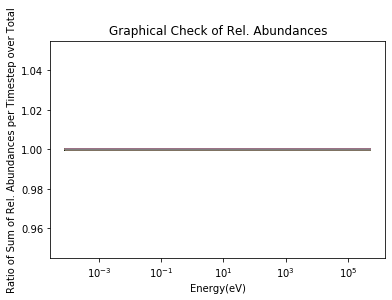

This calculation took 2.90625  sec to graph

 This is for datafile: SkyNet_r-process_0.020000.h5


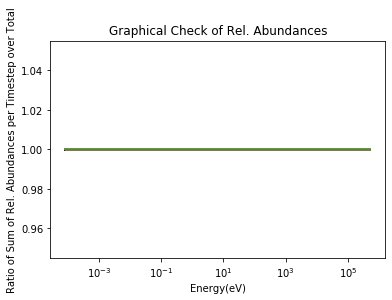

This calculation took 3.90625  sec to graph

 This is for datafile: SkyNet_r-process_0.030000.h5


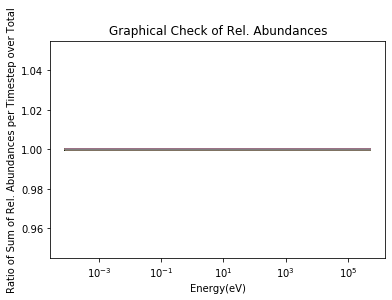

This calculation took 3.65625  sec to graph

 This is for datafile: SkyNet_r-process_0.040000.h5


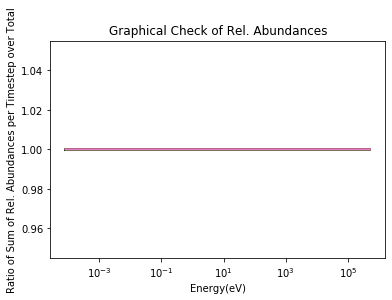

This calculation took 3.125  sec to graph

 This is for datafile: SkyNet_r-process_0.050000.h5


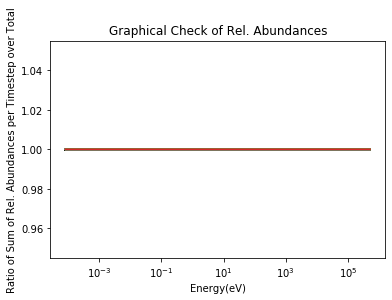

This calculation took 3.171875  sec to graph

 This is for datafile: SkyNet_r-process_0.060000.h5


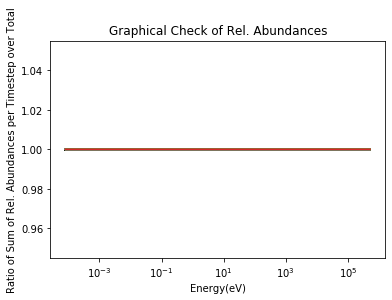

This calculation took 3.5  sec to graph

 This is for datafile: SkyNet_r-process_0.070000.h5


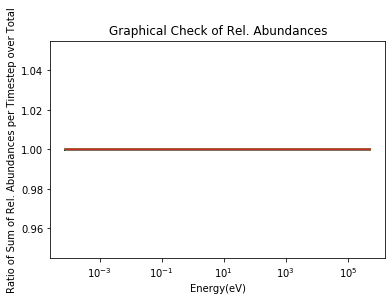

This calculation took 3.5625  sec to graph

 This is for datafile: SkyNet_r-process_0.080000.h5


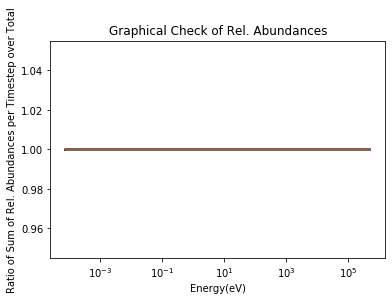

This calculation took 3.65625  sec to graph

 This is for datafile: SkyNet_r-process_0.090000.h5


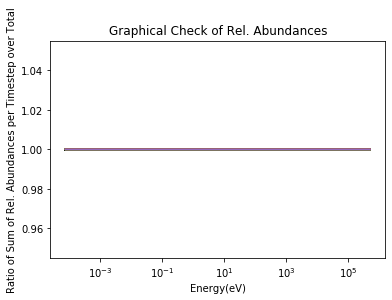

This calculation took 3.203125  sec to graph

 This is for datafile: SkyNet_r-process_0.100000.h5


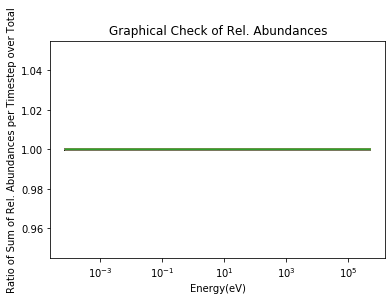

This calculation took 2.875  sec to graph

 This is for datafile: SkyNet_r-process_0.110000.h5


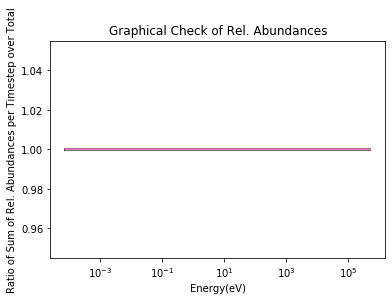

This calculation took 3.078125  sec to graph

 This is for datafile: SkyNet_r-process_0.120000.h5


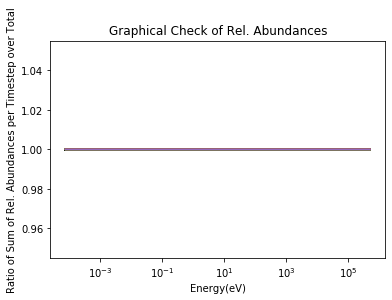

This calculation took 3.296875  sec to graph

 This is for datafile: SkyNet_r-process_0.130000.h5


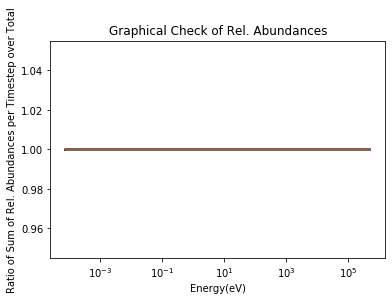

This calculation took 3.28125  sec to graph

 This is for datafile: SkyNet_r-process_0.140000.h5


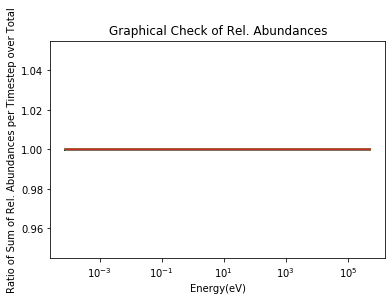

This calculation took 3.078125  sec to graph

 This is for datafile: SkyNet_r-process_0.150000.h5


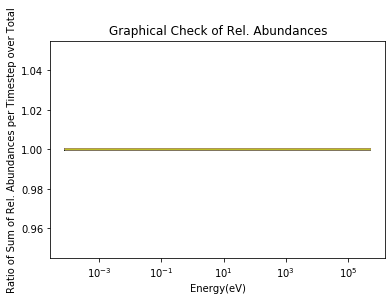

This calculation took 3.140625  sec to graph

 This is for datafile: SkyNet_r-process_0.160000.h5


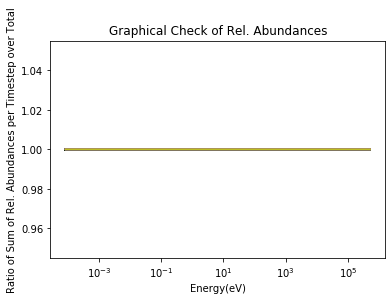

This calculation took 2.96875  sec to graph

 This is for datafile: SkyNet_r-process_0.170000.h5


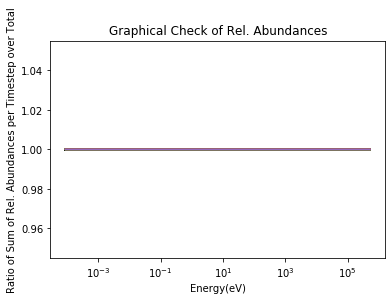

This calculation took 2.734375  sec to graph

 This is for datafile: SkyNet_r-process_0.180000.h5


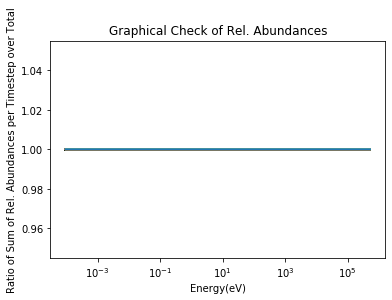

This calculation took 3.109375  sec to graph

 This is for datafile: SkyNet_r-process_0.190000.h5


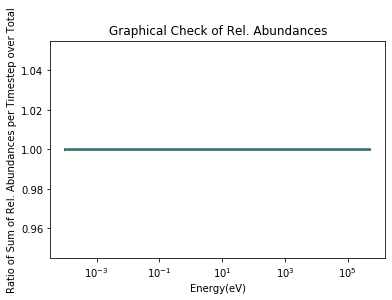

This calculation took 3.0625  sec to graph

 This is for datafile: SkyNet_r-process_0.200000.h5


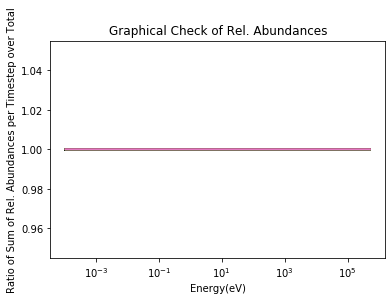

This calculation took 3.46875  sec to graph

 This is for datafile: SkyNet_r-process_0.210000.h5


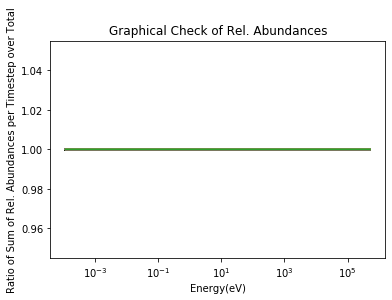

This calculation took 3.015625  sec to graph

 This is for datafile: SkyNet_r-process_0.220000.h5


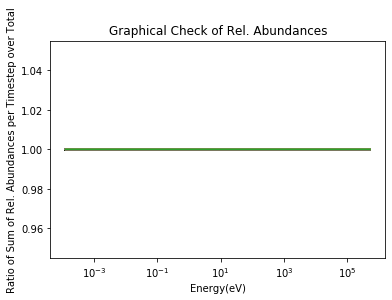

This calculation took 3.03125  sec to graph

 This is for datafile: SkyNet_r-process_0.230000.h5


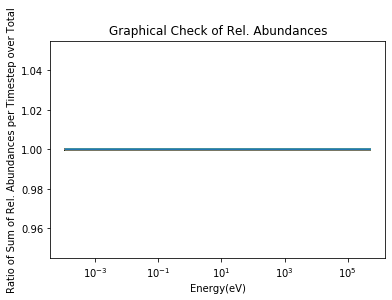

This calculation took 2.609375  sec to graph

 This is for datafile: SkyNet_r-process_0.240000.h5


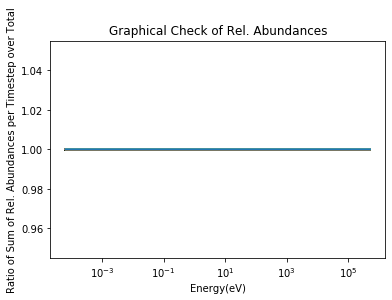

This calculation took 2.75  sec to graph

 This is for datafile: SkyNet_r-process_0.250000.h5


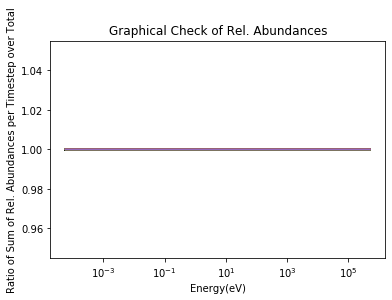

This calculation took 3.234375  sec to graph

 This is for datafile: SkyNet_r-process_0.260000.h5


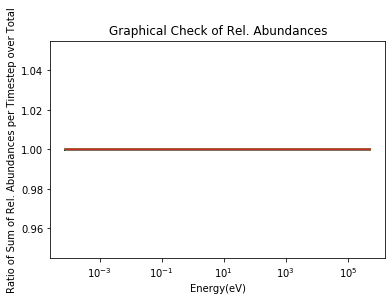

This calculation took 3.65625  sec to graph

 This is for datafile: SkyNet_r-process_0.270000.h5


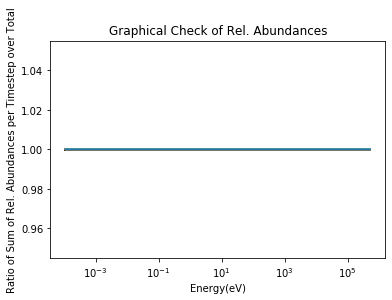

This calculation took 3.40625  sec to graph

 This is for datafile: SkyNet_r-process_0.280000.h5


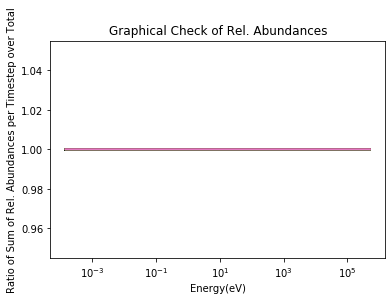

This calculation took 3.03125  sec to graph

 This is for datafile: SkyNet_r-process_0.290000.h5


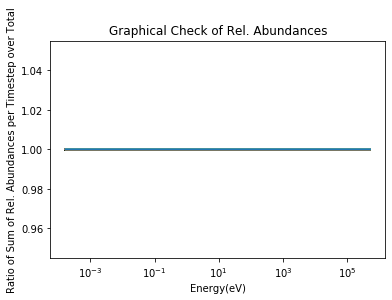

This calculation took 3.03125  sec to graph

 This is for datafile: SkyNet_r-process_0.300000.h5


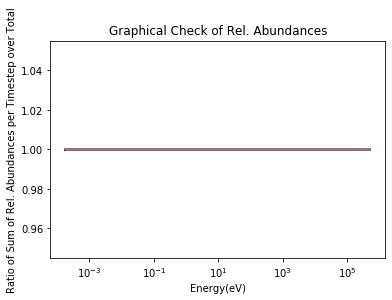

This calculation took 3.0625  sec to graph

 This is for datafile: SkyNet_r-process_0.310000.h5


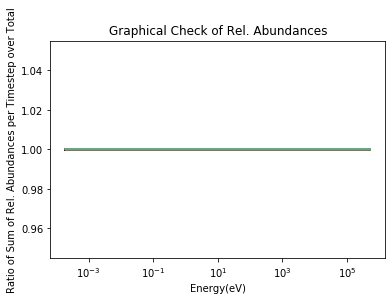

This calculation took 3.125  sec to graph

 This is for datafile: SkyNet_r-process_0.320000.h5


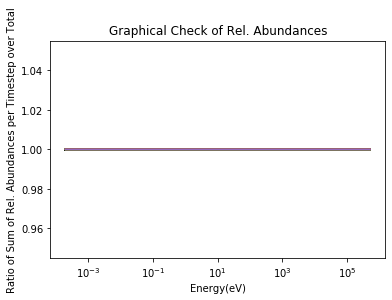

This calculation took 2.65625  sec to graph

 This is for datafile: SkyNet_r-process_0.330000.h5


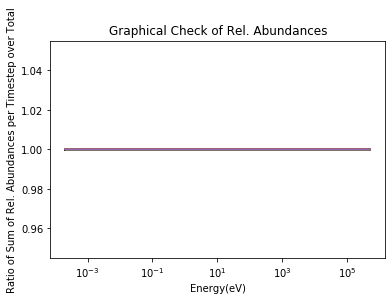

This calculation took 2.53125  sec to graph

 This is for datafile: SkyNet_r-process_0.340000.h5


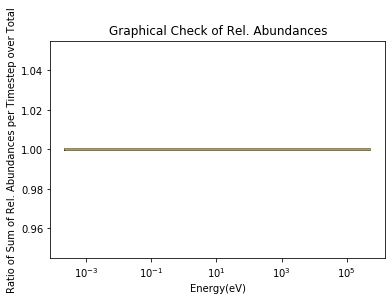

This calculation took 2.484375  sec to graph

 This is for datafile: SkyNet_r-process_0.350000.h5


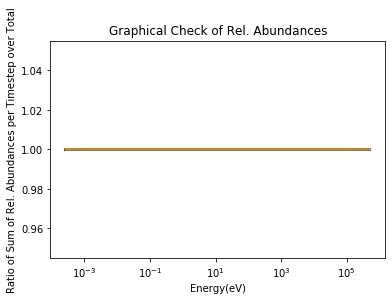

This calculation took 2.390625  sec to graph

 This is for datafile: SkyNet_r-process_0.360000.h5


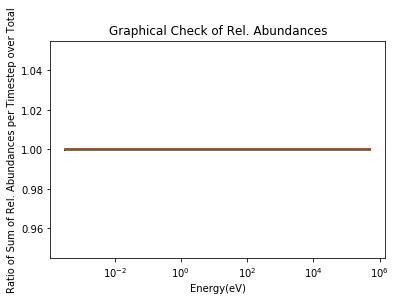

This calculation took 2.21875  sec to graph

 This is for datafile: SkyNet_r-process_0.370000.h5


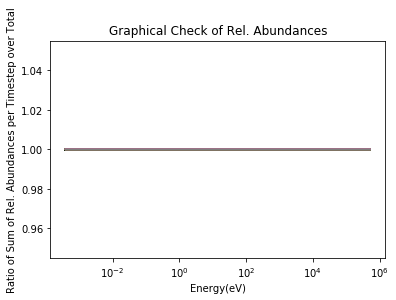

This calculation took 2.03125  sec to graph

 This is for datafile: SkyNet_r-process_0.380000.h5


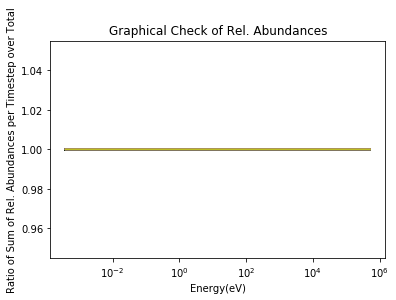

This calculation took 1.84375  sec to graph

 This is for datafile: SkyNet_r-process_0.390000.h5


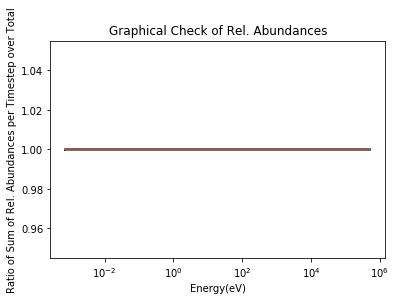

This calculation took 1.390625  sec to graph

 This is for datafile: SkyNet_r-process_0.400000.h5


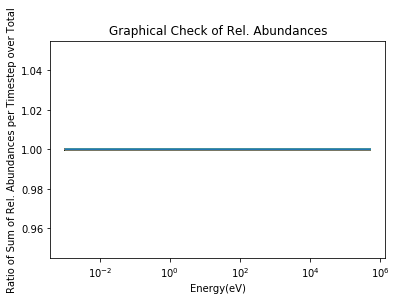

This calculation took 1.3125  sec to graph

 This is for datafile: SkyNet_r-process_0.410000.h5


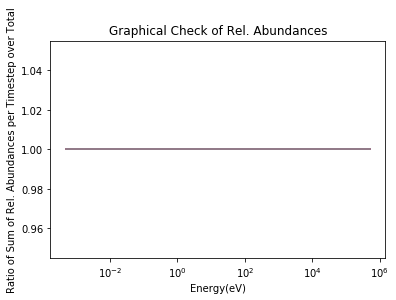

This calculation took 1.171875  sec to graph

 This is for datafile: SkyNet_r-process_0.420000.h5


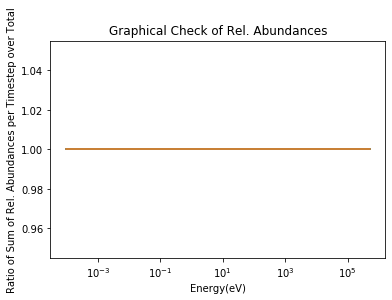

This calculation took 1.15625  sec to graph

 This is for datafile: SkyNet_r-process_0.430000.h5


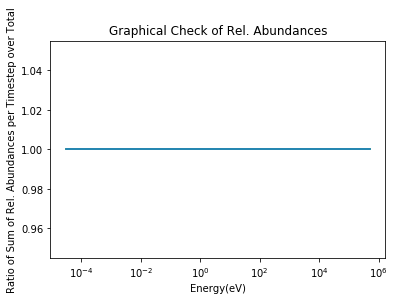

This calculation took 1.015625  sec to graph

 This is for datafile: SkyNet_r-process_0.440000.h5


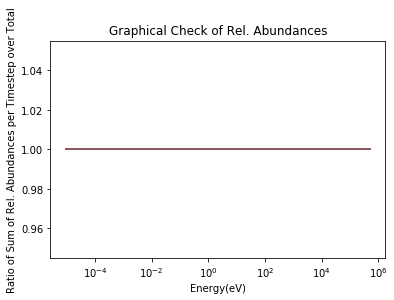

This calculation took 0.78125  sec to graph

 This is for datafile: SkyNet_r-process_0.450000.h5


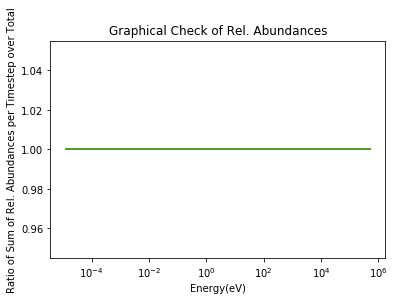

This calculation took 0.578125  sec to graph

 This is for datafile: SkyNet_r-process_0.460000.h5


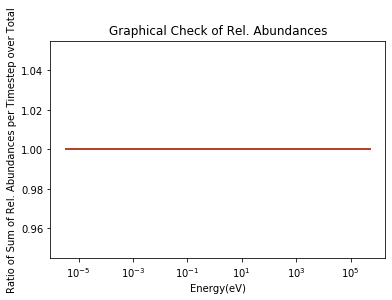

This calculation took 0.609375  sec to graph

 This is for datafile: SkyNet_r-process_0.470000.h5


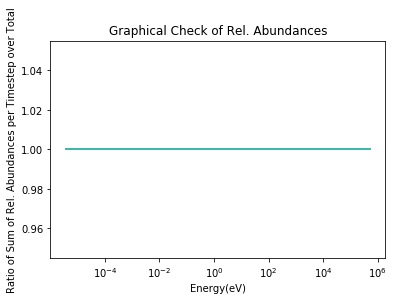

This calculation took 0.6875  sec to graph

 This is for datafile: SkyNet_r-process_0.480000.h5


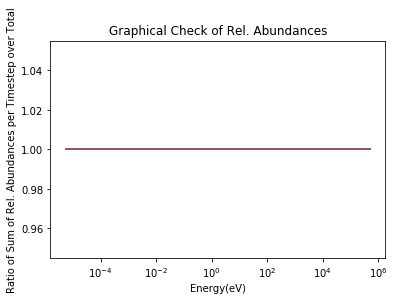

This calculation took 0.8125  sec to graph

 This is for datafile: SkyNet_r-process_0.490000.h5


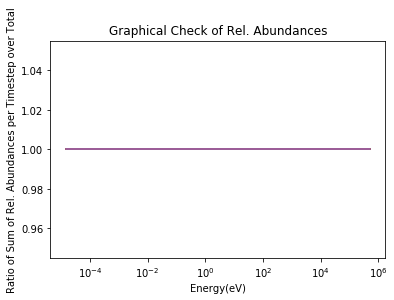

This calculation took 1.234375  sec to graph

 This is for datafile: SkyNet_r-process_0.500000.h5


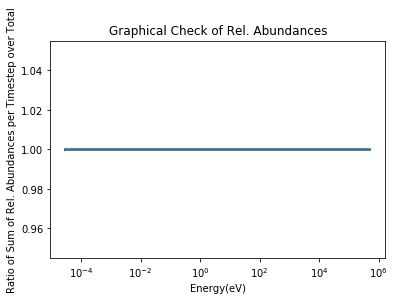

This calculation took 1.28125  sec to graph


In [5]:
#Just doing a graphical check of the abundances for these various Ye values to make sure they make sense!
directory = './Skynet_Files'
for filename in os.listdir(directory):
    hf = h5py.File(directory + '/' + filename)

    temperature = hf["Temperature"]
    time = hf["Time"]
    abundance = hf["Y"]
    charge = hf["Z"]
    
    mod_temp = []
    full_temp = []

    for i in range(1,len(temperature)):
        if temperature[i-1] / temperature[i] ==1:
            index_cut = i-1
            break

    linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
    m = linear[0]

    for i in range(0,len(temperature)):
        if i < index_cut:
            mod_temp.append(np.log10(temperature[i]))
            full_temp.append(temperature[i])
        else:
            del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
            mod_temp.append(mod_temp[i-1]+del_t)
            full_temp.append(10**mod_temp[i])
            
    YI,bad,Ye_free,Ye_bound,Ye_f_Mid = abundance_calculation([8,9])
    print("\n This is for datafile: "+filename)
    plotter(YI)
    plt.show()


(2198,)
(2243,)
(2298,)
(2287,)
(2354,)
(2354,)
(2274,)
(2246,)
(2225,)
(2223,)
(2217,)
(2185,)
(2186,)
(2184,)
(2179,)
(2179,)
(2175,)
(2231,)
(2231,)
(2257,)
(2183,)
(2043,)
(2011,)
(2111,)
(2205,)
(2224,)
(2171,)
(2167,)
(2161,)
(2138,)
(2080,)
(2025,)
(1965,)
(1902,)
(1852,)
(1774,)
(1638,)
(1529,)
(1236,)
(1131,)
(998,)
(992,)
(851,)
(696,)
(463,)
(494,)
(570,)
(666,)
(905,)
(1091,)


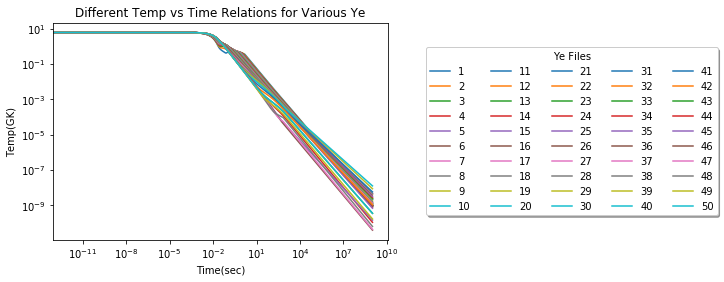

In [48]:
#Temp vs Time relations for all Ye all on one plot

def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
    array = np.array(array)
    return (np.abs(array - value)).argmin()

lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
temps_across_Ye = []

directory = './Skynet_Files'
k=1

for filename in os.listdir(directory):
    hf = h5py.File(directory + '/' + filename)

    temperature = hf["Temperature"]
    time = hf["Time"]
    abundance = hf["Y"]
    charge = hf["Z"]
    
    mod_temp = []
    full_temp = []

    for i in range(1,len(temperature)):
        if temperature[i-1] / temperature[i] ==1:
            index_cut = i-1
            break

    linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
    m = linear[0]

    for i in range(0,len(temperature)):
        if i < index_cut:
            mod_temp.append(np.log10(temperature[i]))
            full_temp.append(temperature[i])
        else:
            del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
            mod_temp.append(mod_temp[i-1]+del_t)
            full_temp.append(10**mod_temp[i])
    
    temps_across_Ye.append(full_temp[find_nearest(time,86400)]) #Remember this value of t = 86400 sec is for 1 day
    print(np.shape(time))
    
    plt.loglog(np.array(time),np.array(full_temp),label = k)
    plt.title('Different Temp vs Time Relations for Various Ye')
    plt.xlabel('Time(sec)')
    plt.ylabel('Temp(GK)')
    k+=1
    
plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'Ye Files',ncol = 5)



,0
0,8.581239e-06
1,8.091957e-06
2,7.885231e-06
3,7.482587e-06
4,7.205391e-06
5,6.897198e-06
6,6.726031e-06
7,6.453885e-06
8,6.195614e-06
9,6.022426e-06


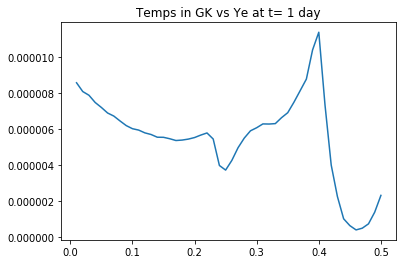

In [17]:
plt.plot(np.arange(.01,.51,.01),temps_across_Ye)
plt.title('Temps in GK vs Ye at t= 1 day') # REMEMBER to change time if required
pd.DataFrame(temps_across_Ye)

C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:137: RuntimeWarning: divide by zero encountered in log
  fLow = np.log(GetYefContribution(Ytot, T9, rho, lnYefLow, xi)) - lnYefLow
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:138: RuntimeWarning: divide by zero encountered in log
  fHi = np.log(GetYefContribution(Ytot, T9, rho, lnYefHi, xi)) - lnYefHi
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:149: RuntimeWarning: divide by zero encountered in log
  fMid = np.log(GetYefContribution(Ytot, T9, rho, lnYefMid, xi)) - lnYefMid


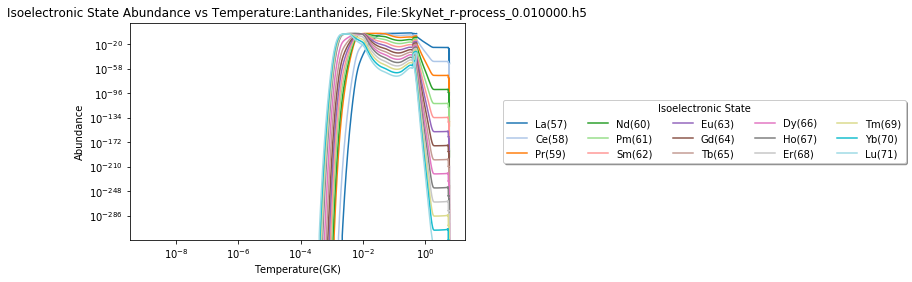

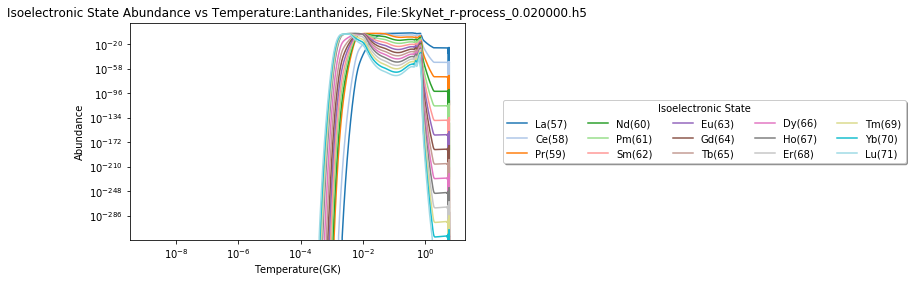

KeyboardInterrupt: 

In [14]:
#Make numerous plots for isoelectronic state vs temp for various Ye. NOTE: Ionization State Calculation only over lanths
time_start = process_time()
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
k = 0
directory = './Skynet_Files'
for filename in os.listdir(directory):
    hf = h5py.File(directory + '/' + filename)

    temperature = hf["Temperature"]
    time = hf["Time"]
    abundance = hf["Y"]
    charge = hf["Z"]
    
    mod_temp = []
    full_temp = []

    for i in range(1,len(temperature)):
        if temperature[i-1] / temperature[i] ==1:
            index_cut = i-1
            break

    linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
    m = linear[0]

    for i in range(0,len(temperature)):
        if i < index_cut:
            mod_temp.append(np.log10(temperature[i]))
            full_temp.append(temperature[i])
        else:
            del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
            mod_temp.append(mod_temp[i-1]+del_t)
            full_temp.append(10**mod_temp[i])
            
    YI,bad,Ye_free,Ye_bound,Ye_f_Mid = abundance_calculation(np.arange(57,72,1))
            
    zmin = 1
    zmax = 15
    
    isoelectronic_abundances = []
    
    for i in range(np.shape(YI[zmax-1])[1]):
        #This for loop has to have 72 values since there are 71 cases with electrons and then the fully ionized case
        specific = np.zeros(len(time))
        for j in range(zmin-1,zmax): #Elements 57 to 71 means indices of 56 to 70
            if i <= np.shape(YI[j])[1]:
                specific+=YI[j][:,np.shape(YI[j])[1]-1-i]
        isoelectronic_abundances.append(specific) 
            
    #Graphing. Note value of n
    n = 15
    colors = plt.cm.tab20(np.linspace(0,1,n))
    for i in range(0,n,1):
        plt.loglog(np.array(full_temp),isoelectronic_abundances[i],label = lanthanide_names[i]+'('+str(57+i)+')',color = colors[i])
        plt.xlabel("Temperature(GK)")
        plt.ylabel("Abundance")
        plt.title('Isoelectronic State Abundance vs Temperature:Lanthanides, File:' + os.listdir(directory)[k])
        #plt.xlim([2e-7,8e-5]) 
        #plt.ylim([0,.0002])
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'Isoelectronic State',ncol = 5)
    k+=1
    
    plt.show()
    
print('This calculation across 50 Ye datasets took:',process_time() - time_start)

**************BEGINNING OF ACTUAL PLOTS. ABOVE ARE JUST TESTS****************

In [19]:
#Make numerous plots for charge state abundances vs time across Ye
time_start = process_time()
k=1

directory = './Skynet_Files'
for filename in os.listdir(directory):
    hf = h5py.File(directory + '/' + filename)

    temperature = hf["Temperature"]
    time = hf["Time"]
    abundance = hf["Y"]
    charge = hf["Z"]
    
    mod_temp = []
    full_temp = []

    for i in range(1,len(temperature)):
        if temperature[i-1] / temperature[i] ==1:
            index_cut = i-1
            break

    linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
    m = linear[0]

    for i in range(0,len(temperature)):
        if i < index_cut:
            mod_temp.append(np.log10(temperature[i]))
            full_temp.append(temperature[i])
        else:
            del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
            mod_temp.append(mod_temp[i-1]+del_t)
            full_temp.append(10**mod_temp[i])
            
    YI,bad,Ye_free,Ye_bound,Ye_f_Mid = abundance_calculation(np.arange(1,104,1))
    
    abundance_file_name = './Ionization_State_Different_Ye/'+'Charge_Abundance_Ye-'+'{:03d}'.format(k)
    with open(abundance_file_name, 'wb') as fp:
        pickle.dump(YI, fp)
    
    elemental,potentials = initialization(np.arange(1,104,1)) #Will need to calculate elemental abundances at least once
    
    elemental_file_name = './Total_Elemental_Abundances/'+'Elemental_Abundances_Ye-'+'{:03d}'.format(k)
    with open(elemental_file_name, 'wb') as fp:
        pickle.dump(elemental, fp)
            
    charge_abundances = [] 

    for i in range(np.shape(YI[70])[1]):
        specific = np.zeros((len(time)))
        for j in range(56,71):
            if i < np.shape(YI[j])[1]:
                #print(i)
                specific+=YI[j][:,i]
        charge_abundances.append(specific)
    
    
    #First plot is absolute abundance
    n = 20
    cm = plt.get_cmap('hsv') #Using prism highlights groups of 3. very useful. same with hsv

    for i in range(0,n,1):
        plt.semilogx(np.array(full_temp),charge_abundances[i],label = i,color = cm(i//3*3.0/n))
        plt.xlabel("Temp(GK)")
        plt.ylabel("Abundance")
        plt.title('Total Abundance of Ionization States vs Temp:Lanthanides, File:' + filename)
        #plt.xlim([2e-6,8e-6])
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'ionization state',ncol = 5)
    
    string = './Animations/'+'lanth(temperature)-'+'{:03d}'.format(k)
    plt.savefig(string,bbox_inches='tight')
    
    plt.show()
    
    #Second plot is relative abundance, but this is relative to the total abundance present
    Ytot = np.sum(elemental,0)
    for i in range(0,n,1):
        plt.semilogx(np.array(full_temp),np.array(charge_abundances[i])/(np.array(Ytot)),label = i,color = cm(i//3*3.0/n))
        plt.xlabel("Temp(GK)")
        plt.ylabel("Rel. Abundance")
        plt.title('Relative Abundance of Ionization States vs Temp:Lanthanides, File:' + filename)
        #plt.xlim([2e-6,8e-6])
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'ionization state',ncol = 5)
    
    string_rel = './Animations/'+'relative(temperature)-'+'{:03d}'.format(k)
    plt.savefig(string_rel,bbox_inches='tight')
    
    plt.show()
    k+=1

    
print('This calculation across 50 Ye datasets took:',process_time() - time_start)

(103, 2198)


C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:137: RuntimeWarning: divide by zero encountered in log
  fLow = np.log(GetYefContribution(Ytot, T9, rho, lnYefLow, xi)) - lnYefLow
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:138: RuntimeWarning: divide by zero encountered in log
  fHi = np.log(GetYefContribution(Ytot, T9, rho, lnYefHi, xi)) - lnYefHi
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:149: RuntimeWarning: divide by zero encountered in log
  fMid = np.log(GetYefContribution(Ytot, T9, rho, lnYefMid, xi)) - lnYefMid


KeyboardInterrupt: 

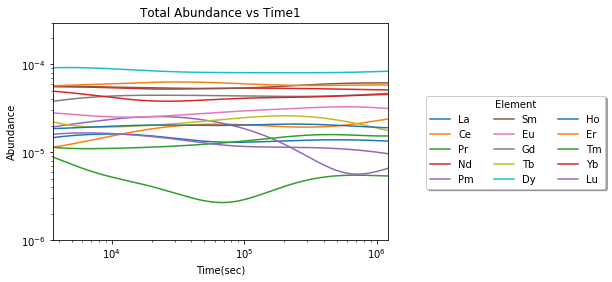

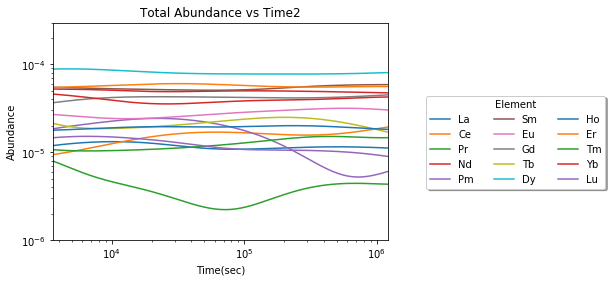

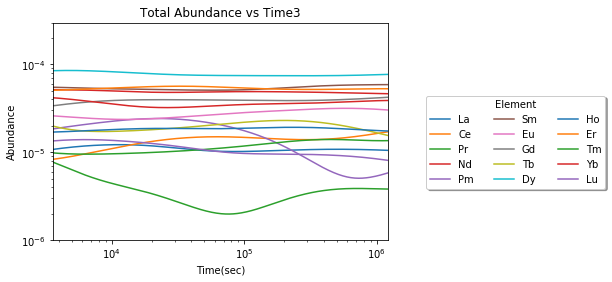

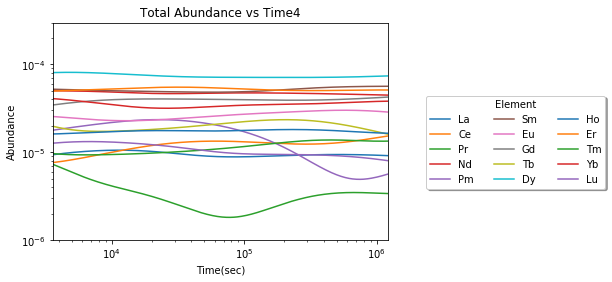

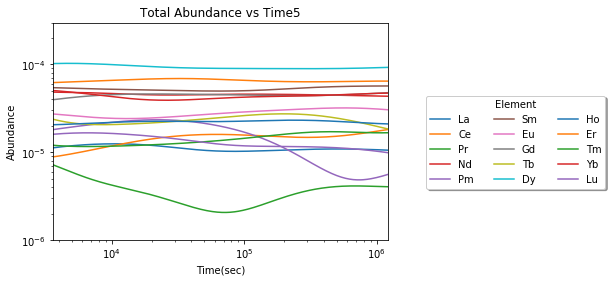

...

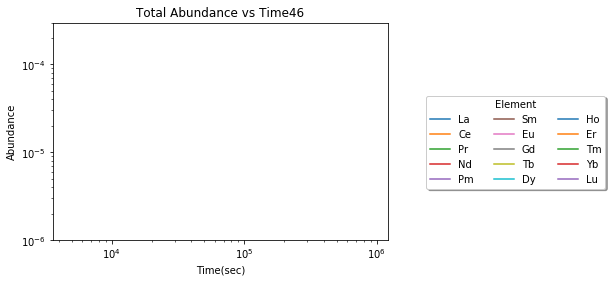

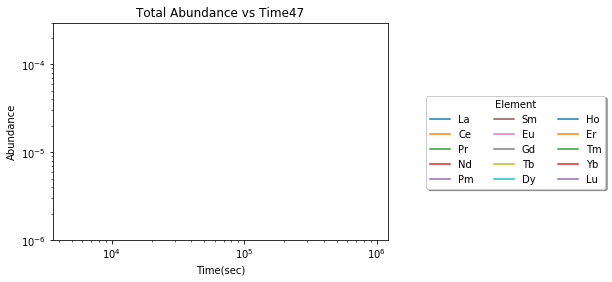

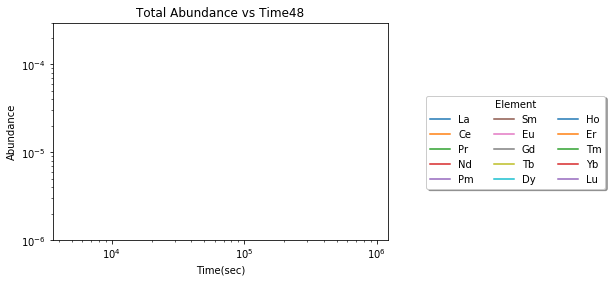

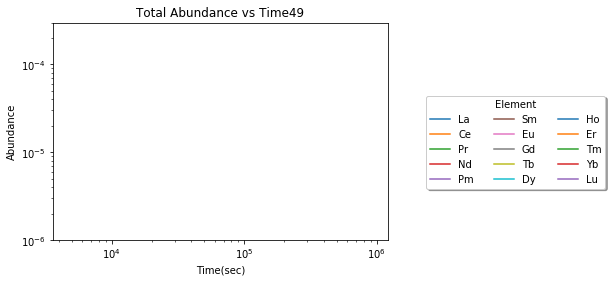

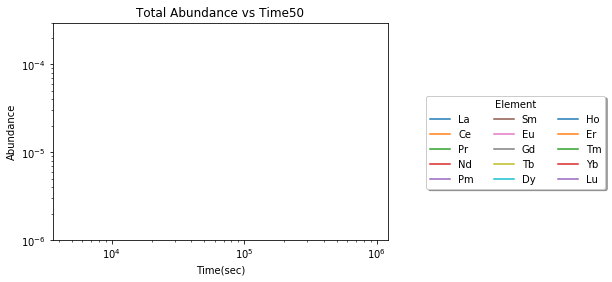

This calculation across 50 Ye datasets took: 4370.6875


In [82]:
#Making animation useful for understanding lanthanide abundances across time
time_start = process_time()

directory = './Skynet_Files'
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
k = 1

for filename in os.listdir(directory):
    hf = h5py.File(directory + '/' + filename)
    
    abundance = hf["Y"]
    charge = hf["Z"]
    time = hf['Time']
    
    elemental,potentials = initialization(np.arange(1,104,1))   
    
    for i in range(56,71):
        plt.loglog(time,elemental[i],label = lanthanide_names[i-56])
        plt.xlim(3600,1209600)
        plt.ylim(1e-6,3e-4)
        plt.title('Total Abundance vs Time'+str(k))
        plt.xlabel('Time(sec)')
        plt.ylabel('Abundance')
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.45),shadow = True,fancybox = True,title = 'Element',ncol = 3)
        
    string = './Animations/'+'image-'+'{:03d}'.format(k)
    plt.savefig(string,bbox_inches='tight')
    k+=1
    plt.show()
    
print('This calculation across 50 Ye datasets took:',process_time() - time_start)

Text(0.25, 4e-05, 'Ye=.25')

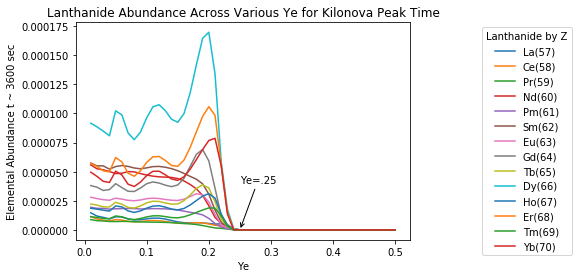

In [34]:
#I want to make a quick graph depicting the abundances of a certain lanthanide or all of them based on different Ye values
#but for the timestep of an hour. 
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
elemental_peak = []
peaktime = 3600 #sec

def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
    array = np.array(array)
    return (np.abs(array - value)).argmin()

directory = './Skynet_Files'
directory2 = './Total_Elemental_Abundances'
fileamount = 50

for i in range(15):
    elemental_temp = []

    for j in range(fileamount):
        hf = h5py.File(directory + '/' + os.listdir(directory)[j])
        time = hf['Time']
        temp = hf['Temperature']

        with open(directory2 + '/' +  os.listdir(directory2)[j], "rb") as fp:   # Unpickling
            elemental = pickle.load(fp)

        elemental_temp.append(elemental[56+i,find_nearest(time,peaktime)])
        
    elemental_peak.append(elemental_temp)


for i in range(np.shape(elemental_peak)[0]):    
    plt.plot(np.arange(.01,.51,.01),elemental_peak[i],label = lanthanide_names[i]+'('+str(57+i)+')' )
    plt.xlabel('Ye')
    plt.ylabel('Elemental Abundance t ~ 3600 sec')
    plt.title('Lanthanide Abundance Across Various Ye for Kilonova Peak Time')
plt.legend(bbox_to_anchor=(1.2, 1.0),title = 'Lanthanide by Z')
plt.annotate('Ye=.25',(.25,0),xytext = (.25,.00004),arrowprops=dict(arrowstyle='->'))


Text(0.25, 4e-05, 'Ye=.25')

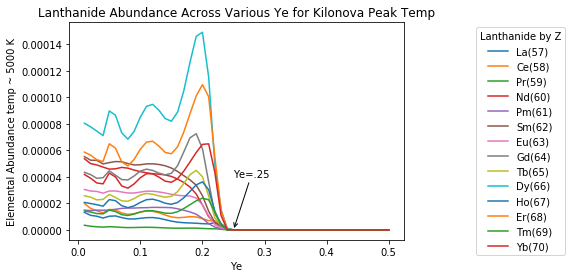

In [80]:
#I want to make a quick graph depicting the abundances of a certain lanthanide or all of them based on different Ye values
#but for the 2000 to 8000K range 
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
elemental_peak = []
peaktemp = 5e-6 #GK

def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
    array = np.array(array)
    return (np.abs(array - value)).argmin()

directory = './Skynet_Files'
directory2 = './Total_Elemental_Abundances'
fileamount = 50

for k in range(15):
    elemental_temp = []

    for j in range(fileamount):
        hf = h5py.File(directory + '/' + os.listdir(directory)[j])
        
        temperature = hf["Temperature"]
        time = hf["Time"]
        abundance = hf["Y"]
        charge = hf["Z"]

        mod_temp = []
        full_temp = []

        for i in range(1,len(temperature)):
            if temperature[i-1] / temperature[i] ==1:
                index_cut = i-1
                break

        linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
        m = linear[0]

        for i in range(0,len(temperature)):
            if i < index_cut:
                mod_temp.append(np.log10(temperature[i]))
                full_temp.append(temperature[i])
            else:
                del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
                mod_temp.append(mod_temp[i-1]+del_t)
                full_temp.append(10**mod_temp[i])

        with open(directory2 + '/' +  os.listdir(directory2)[j], "rb") as fp:   # Unpickling
            elemental = pickle.load(fp)

        elemental_temp.append(elemental[56+k,find_nearest(full_temp,peaktemp)])
        
    elemental_peak.append(elemental_temp)


for i in range(np.shape(elemental_peak)[0]):    
    plt.plot(np.arange(.01,.51,.01),elemental_peak[i],label = lanthanide_names[i]+'('+str(57+i)+')' )
    plt.xlabel('Ye')
    plt.ylabel('Elemental Abundance temp ~ 5000 K')
    plt.title('Lanthanide Abundance Across Various Ye for Kilonova Peak Temp')
plt.legend(bbox_to_anchor=(1.2, 1.0),title = 'Lanthanide by Z')
plt.annotate('Ye=.25',(.25,0),xytext = (.25,.00004),arrowprops=dict(arrowstyle='->'))


Text(0.25, 4e-05, 'Ye=.25')

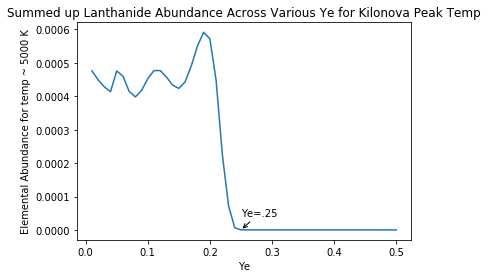

In [28]:
#Plotting total lanthanide abundance vs Ye at a specific temp 
#I want to make a quick graph depicting the abundances of a certain lanthanide or all of them based on different Ye values
#but for the 2000 to 8000K range 
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']
elemental_peak = []
peaktemp = 5e-6 #GK

def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
    array = np.array(array)
    return (np.abs(array - value)).argmin()

directory = './Skynet_Files'
directory2 = './Total_Elemental_Abundances'
fileamount = 50

for k in range(15):
    elemental_temp = []

    for j in range(fileamount):
        hf = h5py.File(directory + '/' + os.listdir(directory)[j])
        
        temperature = hf["Temperature"]
        time = hf["Time"]
        abundance = hf["Y"]
        charge = hf["Z"]

        mod_temp = []
        full_temp = []

        for i in range(1,len(temperature)):
            if temperature[i-1] / temperature[i] ==1:
                index_cut = i-1
                break

        linear = np.polyfit(np.log10(np.array(time[index_cut-300:index_cut])),np.log10(np.array(temperature[index_cut-300:index_cut])),1)
        m = linear[0]

        for i in range(0,len(temperature)):
            if i < index_cut:
                mod_temp.append(np.log10(temperature[i]))
                full_temp.append(temperature[i])
            else:
                del_t = m*(np.log10(time[i]) - np.log10(time[i-1]))
                mod_temp.append(mod_temp[i-1]+del_t)
                full_temp.append(10**mod_temp[i])

        with open(directory2 + '/' +  os.listdir(directory2)[j], "rb") as fp:   # Unpickling
            elemental = pickle.load(fp)

        elemental_temp.append(elemental[56+k,find_nearest(full_temp,peaktemp)])
    elemental_peak.append(elemental_temp)


plt.plot(np.arange(.01,.51,.01),np.sum(elemental_peak,0))
plt.xlabel('Ye')
plt.ylabel('Elemental Abundance for temp ~ 5000 K')
plt.title('Summed up Lanthanide Abundance Across Various Ye for Kilonova Peak Temp')
plt.annotate('Ye=.25',(.25,0),xytext = (.25,.00004),arrowprops=dict(arrowstyle='->'))


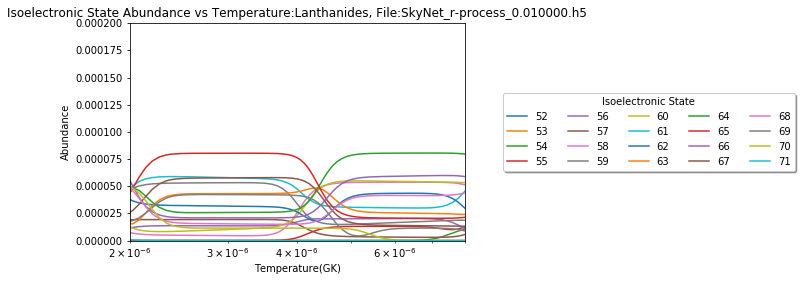

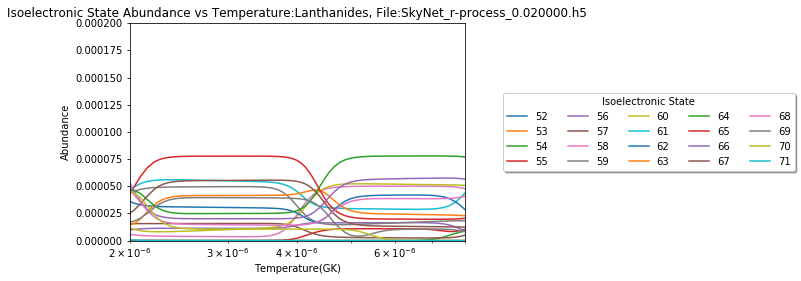

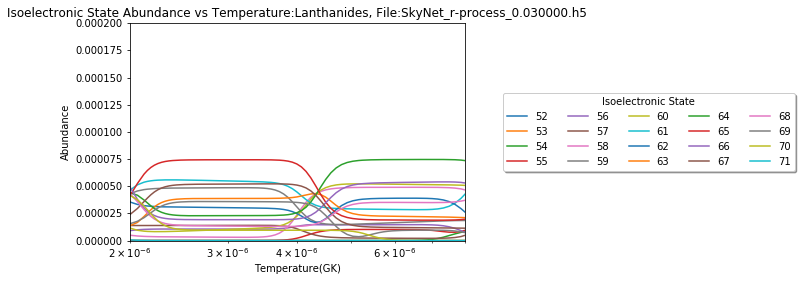

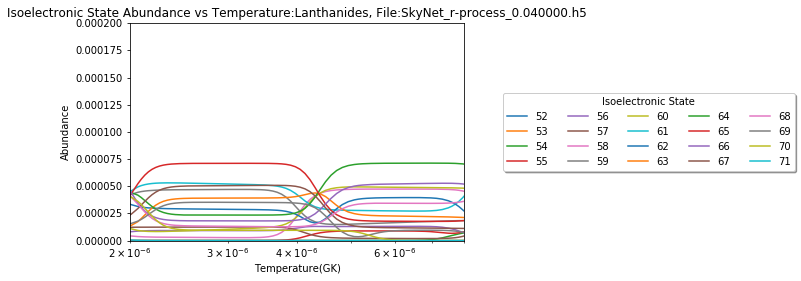

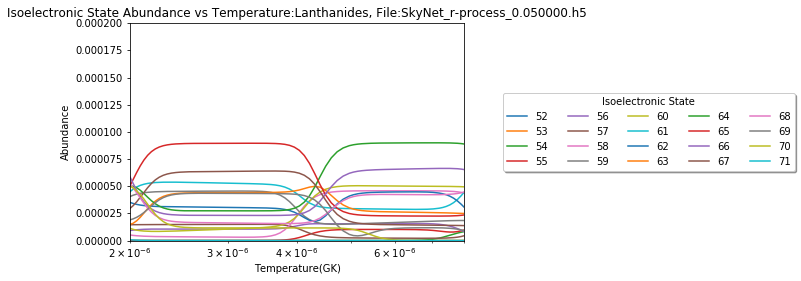

...

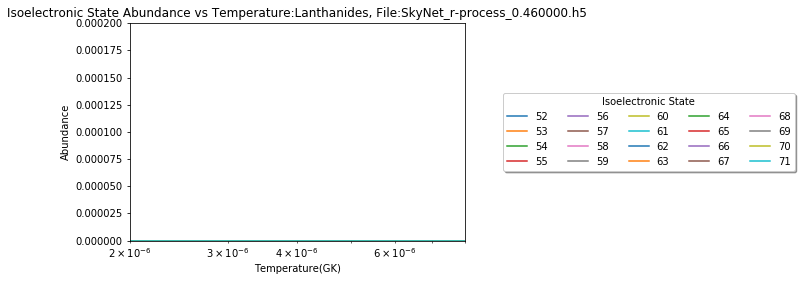

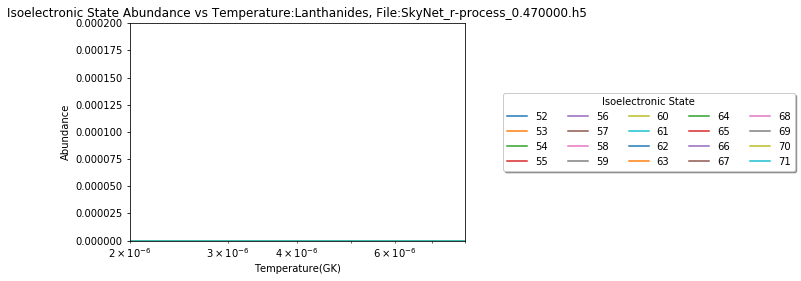

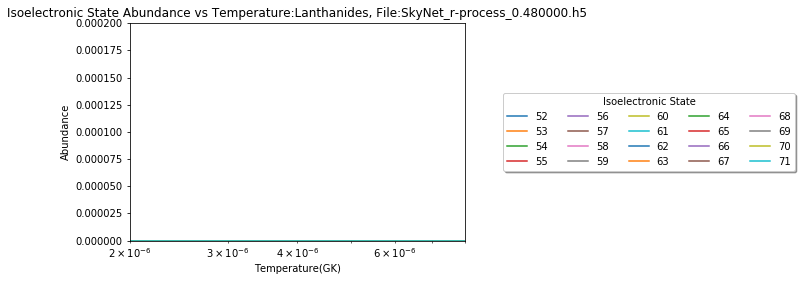

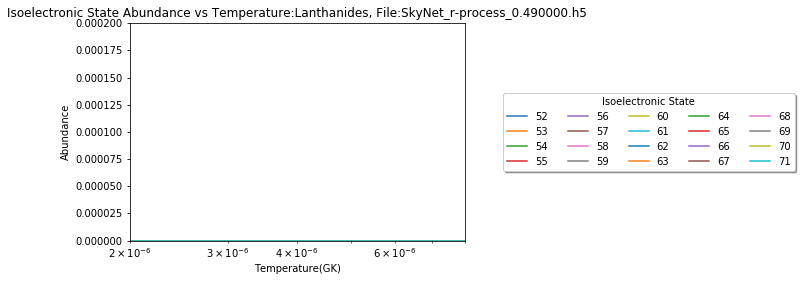

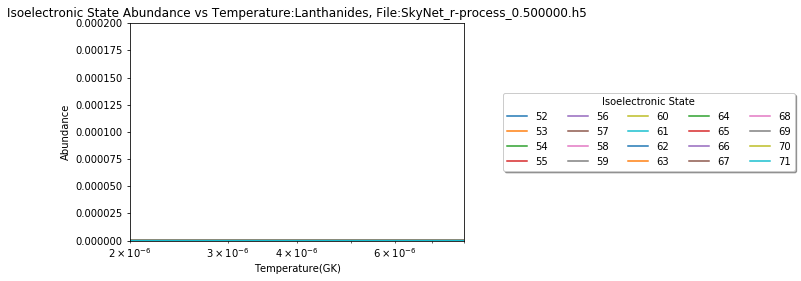

In [193]:
#I will also make plots of the isoelectronic state abundances. I am using ionization state abundances to find isoelectronic 

directory = './Skynet_Files'
directory_ionization = './Ionization_State_Different_Ye'
fileamount = 50
cm = plt.get_cmap('hsv') #Using prism highlights groups of 3. very useful. same with hsv

for k in range(fileamount):
    #First section is dedicated to setting up temperature and opening files
    hf = h5py.File(directory + '/' + os.listdir(directory)[k])
    time = hf['Time']   
    full_temp = temp_calculator(hf)  
    
    with open(directory_ionization + '/' +  os.listdir(directory_ionization)[k], "rb") as fp:   
        YI = pickle.load(fp)
    
    #This chunk helps find the total isoelectronic state abundances
    zmin = 57
    zmax = 71
    
    isoelectronic_abundances = []
    
    for i in range(np.shape(YI[zmax-1])[1]):
        '''This for loop has to have 72 values since there are 71 cases with electrons and then the fully ionized case'''
        specific = np.zeros(len(time))
        for j in range(zmin-1,zmax): #Elements 57 to 71 means indices of 56 to 70
            if i <= np.shape(YI[j])[1]:
                specific+=YI[j][:,np.shape(YI[j])[1]-1-i]
        isoelectronic_abundances.append(specific) 
            
    n = 72
    for i in range(52,n,1):
        plt.semilogx(np.array(full_temp),isoelectronic_abundances[i],label = i)
        plt.xlabel("Temperature(GK)")
        plt.ylabel("Abundance")
        plt.title('Isoelectronic State Abundance vs Temperature:Lanthanides, File:' + os.listdir(directory)[k])
        plt.xlim([2e-6,8e-6]) #Temperatures of 2000 to 8000 K
        plt.ylim([0,.0002])
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'Isoelectronic State',ncol = 5)
    
    string = './Animations/'+'isoelectronic-'+'{:03d}'.format(k+1)
    plt.savefig(string,bbox_inches='tight')
    plt.show()

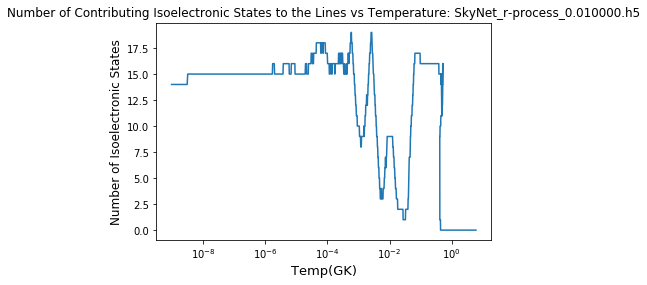

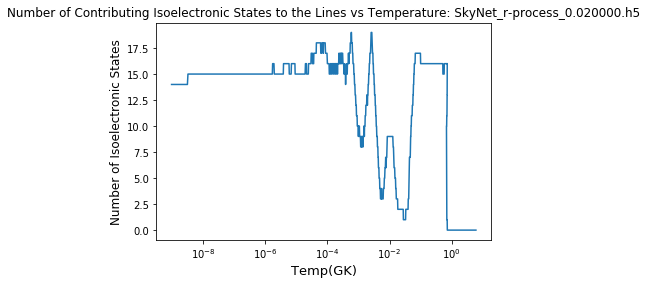

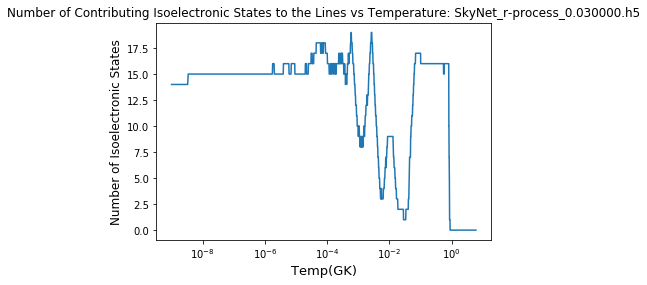

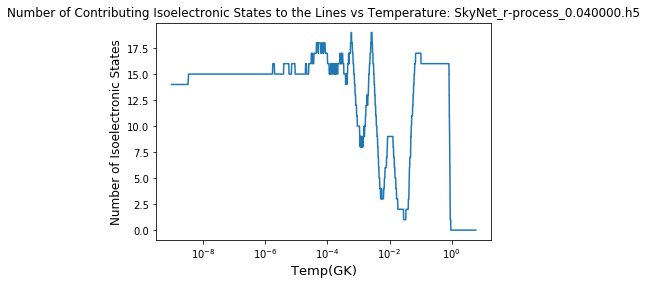

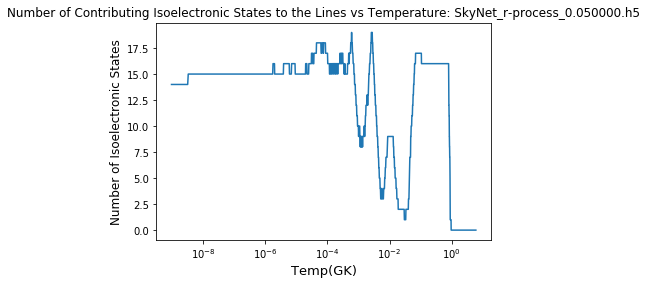

...

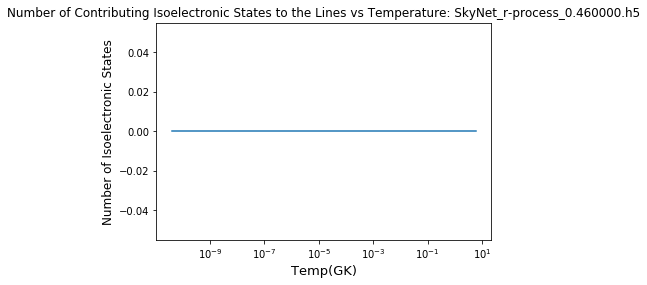

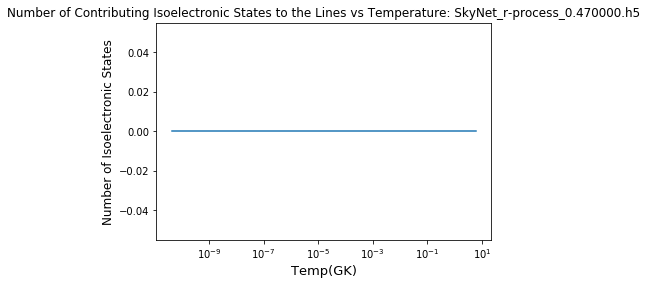

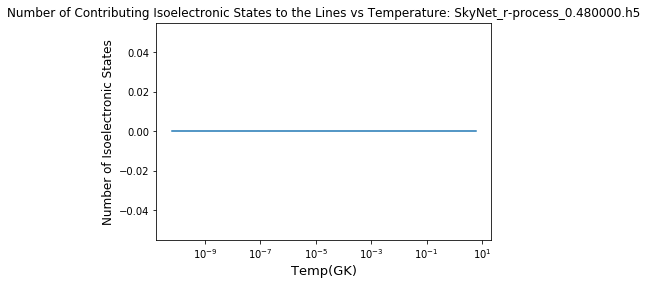

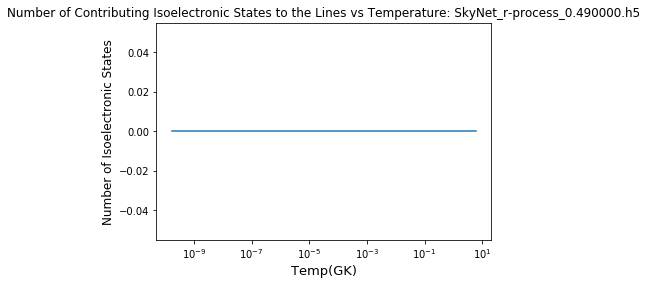

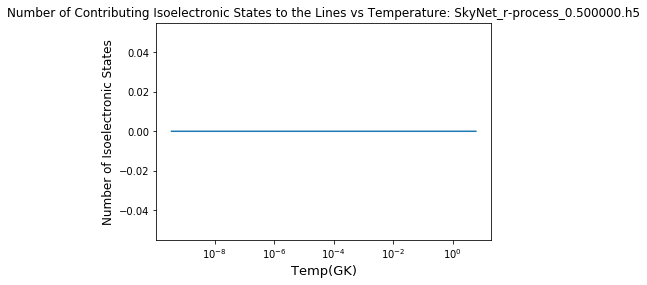

In [228]:
#Plot Number of Contributing Isoelectronic States Using 1e-6 threshold
abundanceThreshold = 1.e-6
directory = './Skynet_Files'
directory_ionization = './Ionization_State_Different_Ye'
fileamount = 50

for k in range(fileamount):
    hf = h5py.File(directory + '/' + os.listdir(directory)[k])
    time = hf['Time']   
    full_temp = temp_calculator(hf)
    
    with open(directory_ionization + '/' +  os.listdir(directory_ionization)[k], "rb") as fp:   
        YI = pickle.load(fp)
    
    #This chunk helps find the total isoelectronic state abundances
    zmin = 57
    zmax = 71
    
    isoelectronic_abundances = []
    
    for i in range(np.shape(YI[zmax-1])[1]):
        '''This for loop has to have 72 values since there are 71 cases with electrons and then the fully ionized case'''
        specific = np.zeros(len(time))
        for j in range(zmin-1,zmax): #Elements 57 to 71 means indices of 56 to 70
            if i <= np.shape(YI[j])[1]:
                specific+=YI[j][:,np.shape(YI[j])[1]-1-i]
        isoelectronic_abundances.append(specific) 
      
    isoelectronic_abundances = np.array(isoelectronic_abundances)
   
    NContribute = np.count_nonzero(np.where(isoelectronic_abundances > abundanceThreshold, np.ones(isoelectronic_abundances.shape), np.zeros(isoelectronic_abundances.shape)), 0)
    
    plt.semilogx(np.array(full_temp), NContribute)
    plt.xlabel('Temp(GK)',fontsize = 13)
    plt.ylabel('Number of Isoelectronic States',fontsize = 12)
    plt.title("Number of Contributing Isoelectronic States to the Lines vs Temperature: " + os.listdir(directory)[k])
    
    string = './Animations/'+'number_iso-'+'{:03d}'.format(k+1)
    plt.savefig(string,bbox_inches='tight')
    plt.show()

Make a plot showing the first ionized charge state abundance total as well as for each element

In [ ]:
#Make numerous plots for charge state abundances vs time across Ye
#So each abundance plotted is some +1 ionization state abundance for a given element or the total

time_start = process_time()
fileamount = 50
directory = './Skynet_Files'
directory_ionization = './Ionization_State_Different_Ye'
lanthanide_names = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu']

for k in range(fileamount):
    hf = h5py.File(directory + '/' + os.listdir(directory)[k])
    
    temperature = hf["Temperature"]
    time = hf['Time']   
    full_temp = temp_calculator(hf)
    
    with open(directory_ionization + '/' +  os.listdir(directory_ionization)[k], "rb") as fp:   
        YI = pickle.load(fp)
    
    charge_abundances = [] 

    for i in range(np.shape(YI[70])[1]):
        specific = np.zeros((len(time)))
        for j in range(56,71):
            if i < np.shape(YI[j])[1]:
                #print(i)
                specific+=YI[j][:,i]
        charge_abundances.append(specific)
    
    
    n = 15
    cm = plt.get_cmap('hsv') 
    
    for i in range(0,n,1):
        plt.semilogx(np.array(full_temp),charge_abundances[1],color = 'black')
        plt.semilogx(np.array(full_temp),YI[56+i][:,1],label = lanthanide_names[i])
        plt.xlabel("Temp(GK)")
        plt.ylabel("Abundance")
        plt.title('Contributing Ionization State Abundances to +1 State vs Temp:Lanthanides, File:' + os.listdir(directory)[k])
        plt.xlim([1e-6,1e-5])
    plt.legend(loc='center left', bbox_to_anchor=(1.1, 0.5),shadow = True,fancybox = True,title = 'ionization state',ncol = 5)
    
    #string = './Animations/'+ '+1_dist-'+'{:03d}'.format(k+1)
    #plt.savefig(string,bbox_inches='tight')
    plt.show()
    
    
print('This calculation across 50 Ye datasets took:',process_time() - time_start)

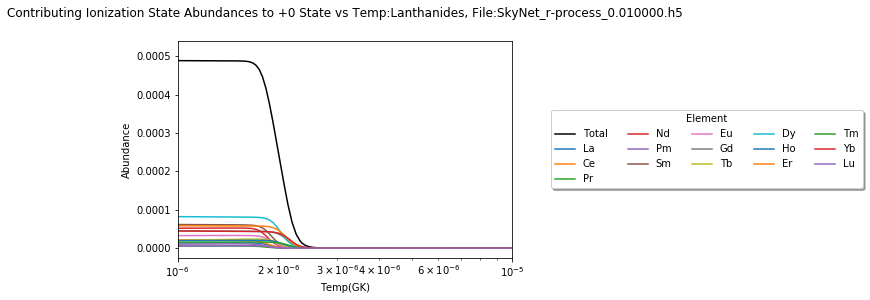

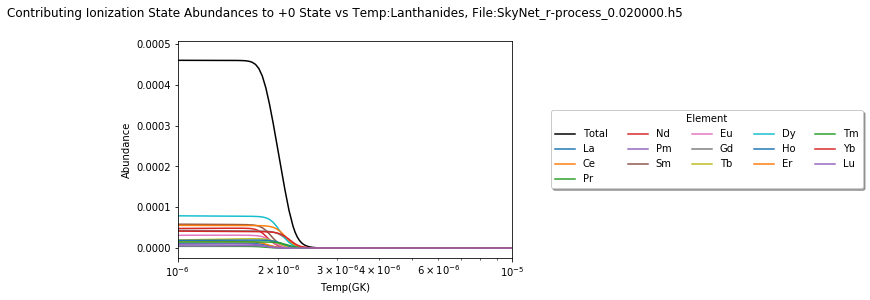

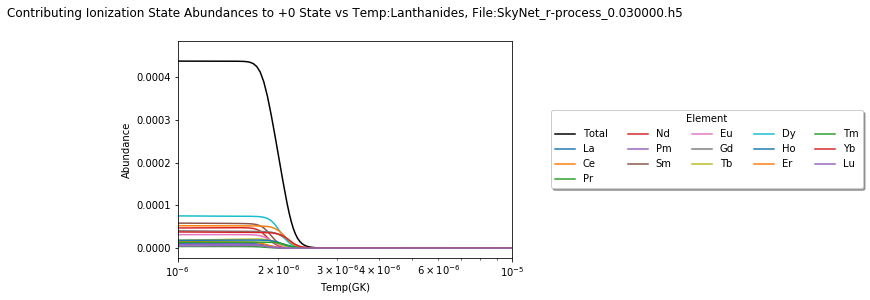

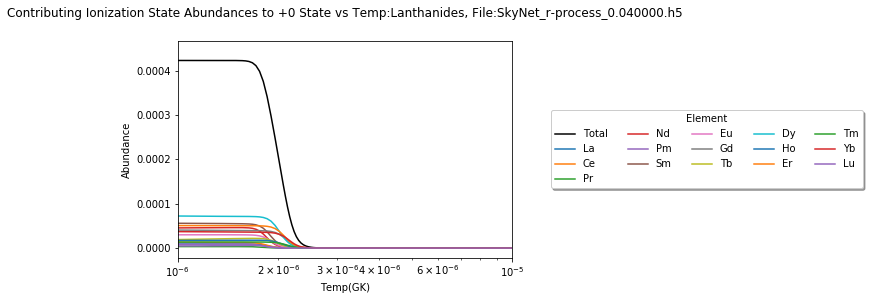

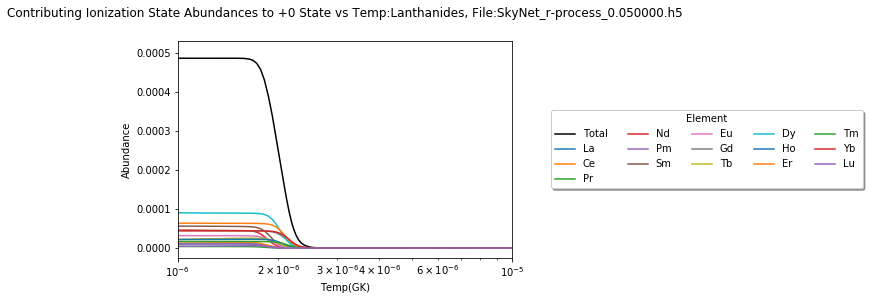

...

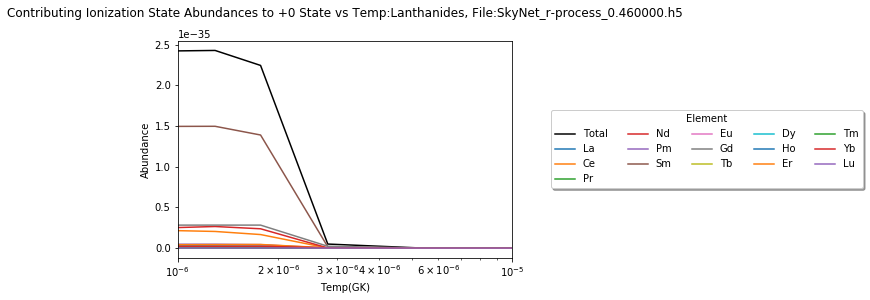

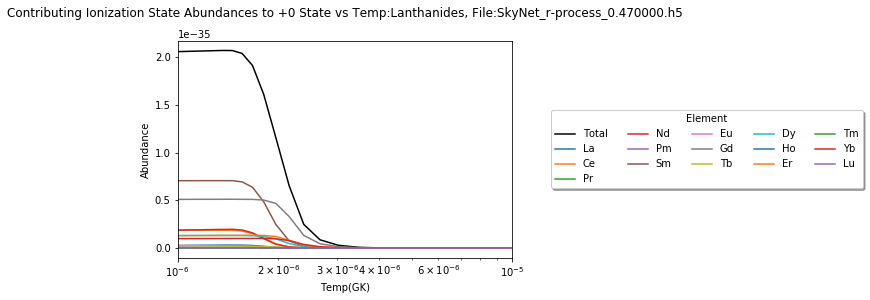

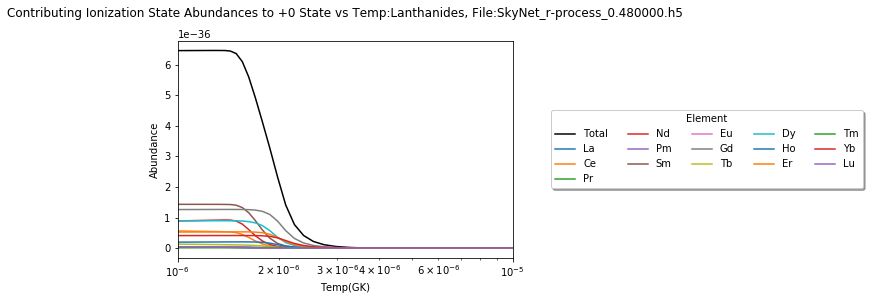

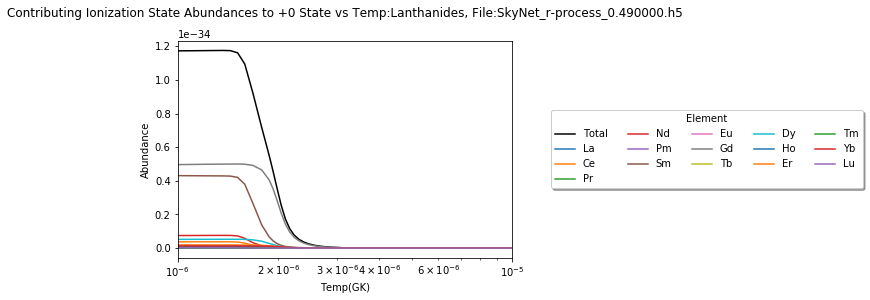

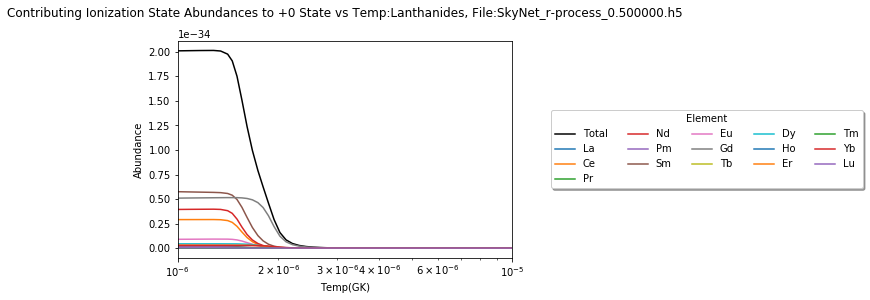

This calculation across 50 Ye datasets took: 58.734375


In [10]:
distribution_ionization(0)

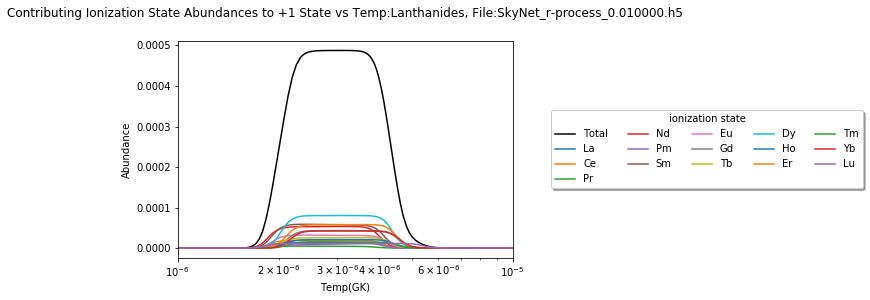

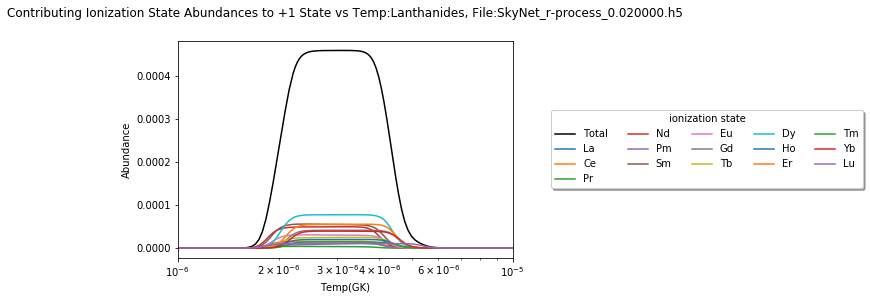

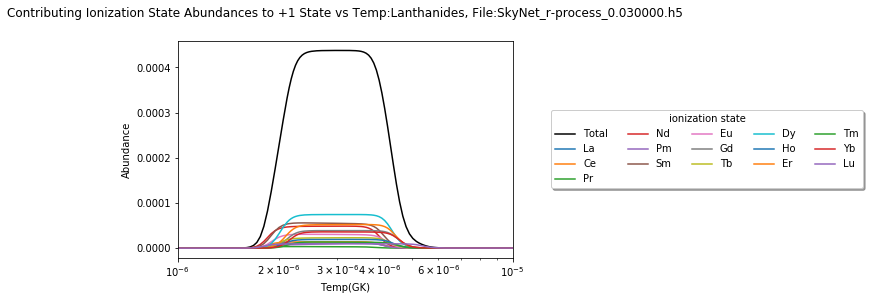

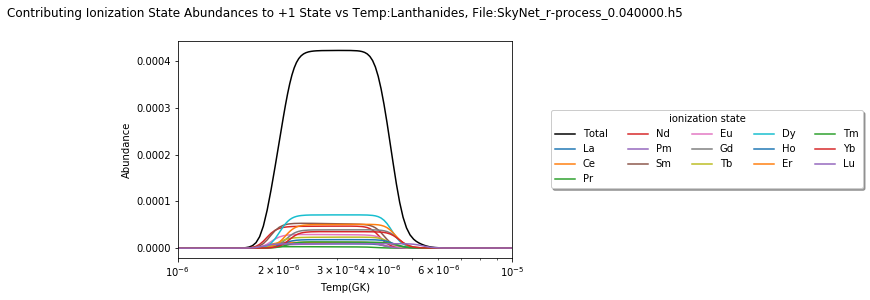

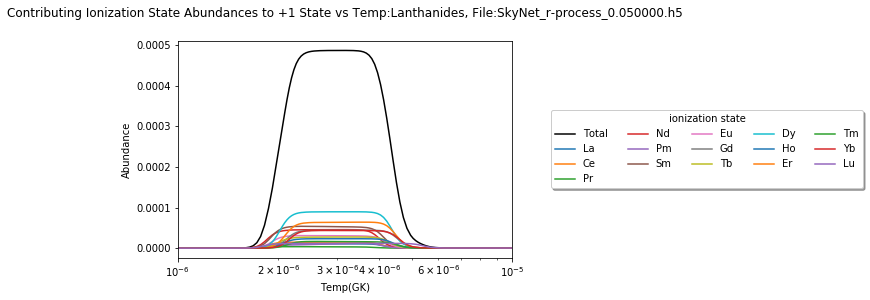

...

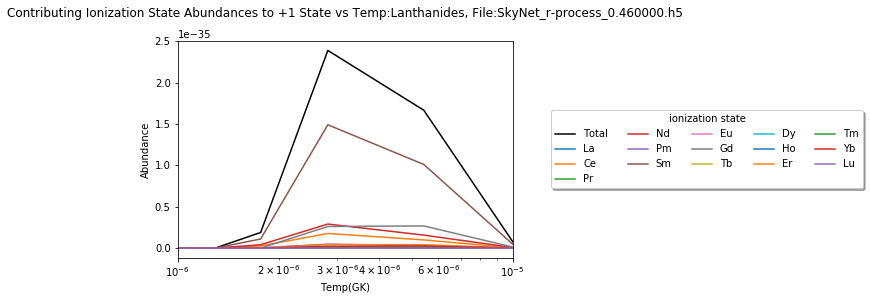

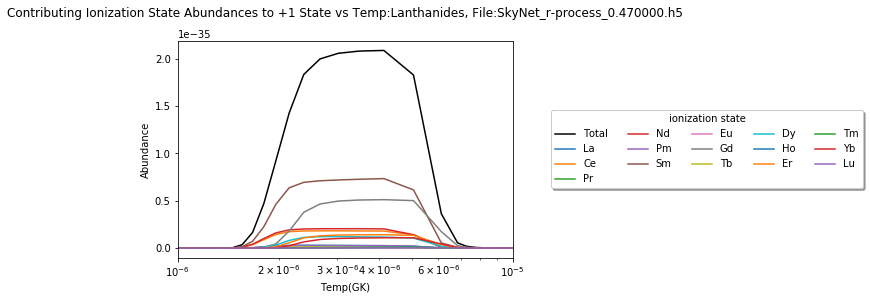

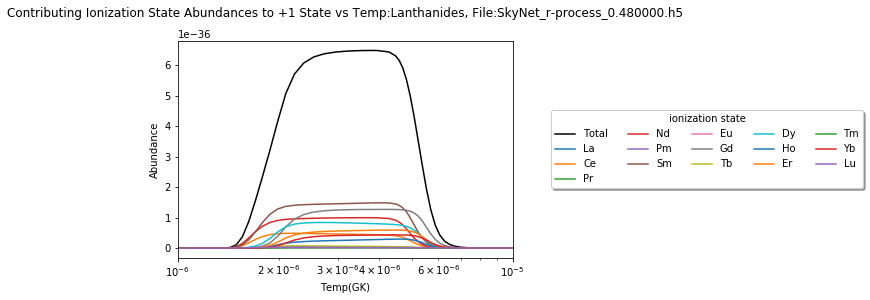

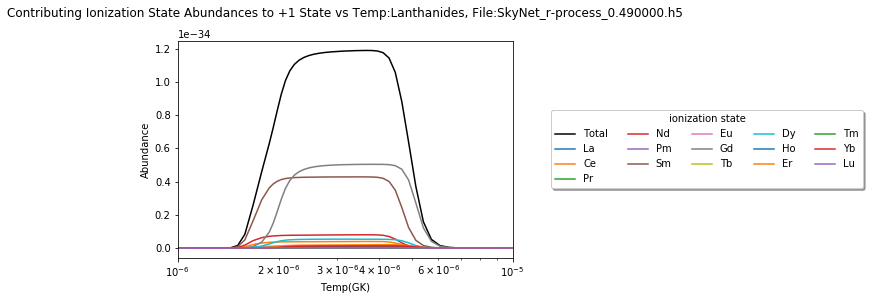

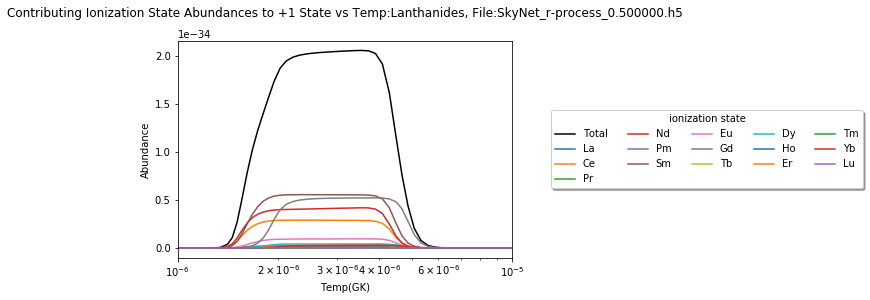

This calculation across 50 Ye datasets took: 59.046875


In [24]:
distribution_ionization(1) 

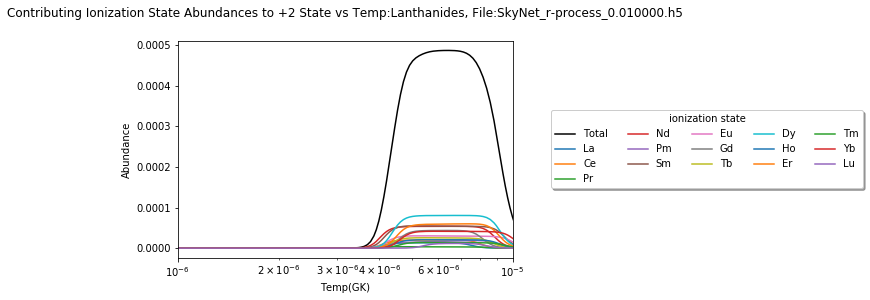

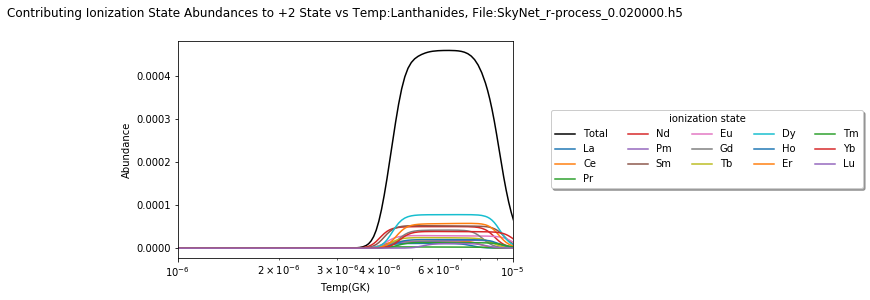

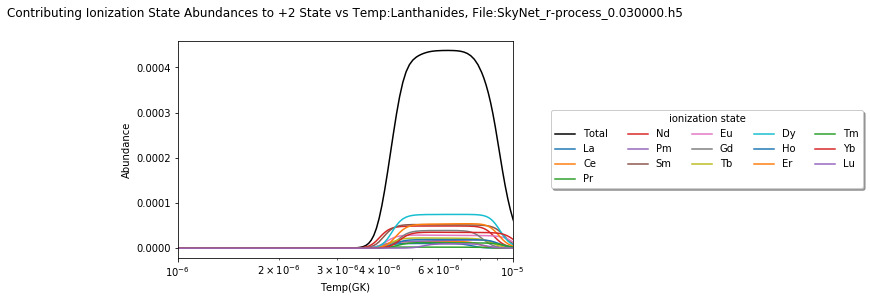

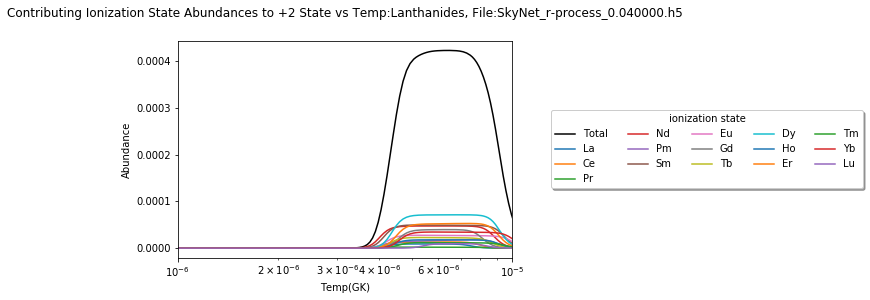

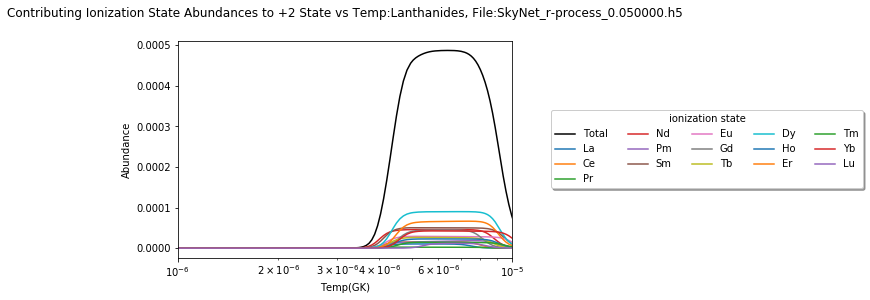

...

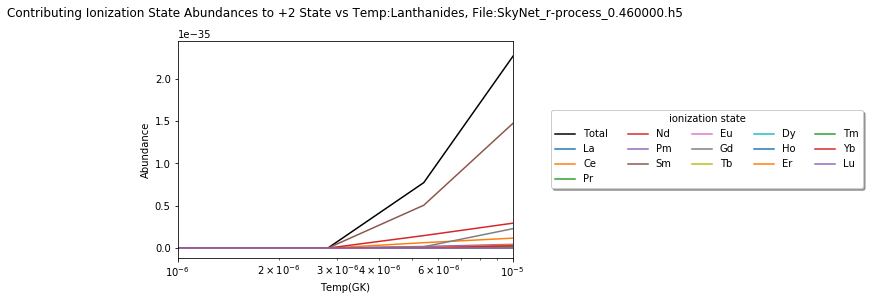

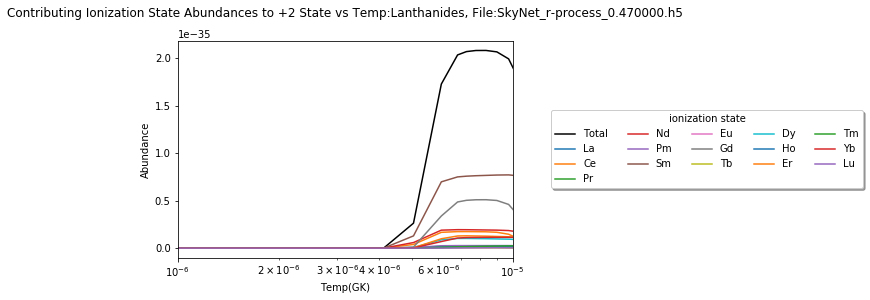

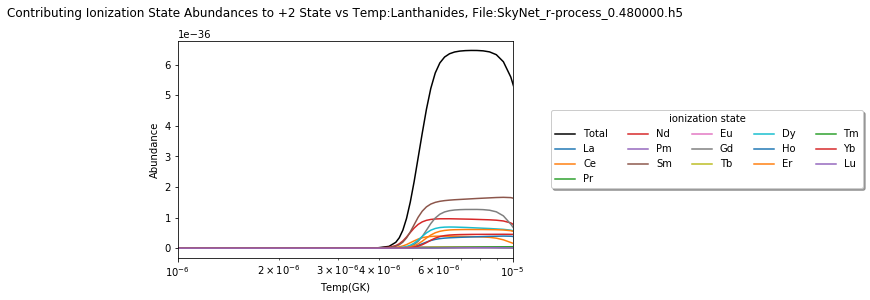

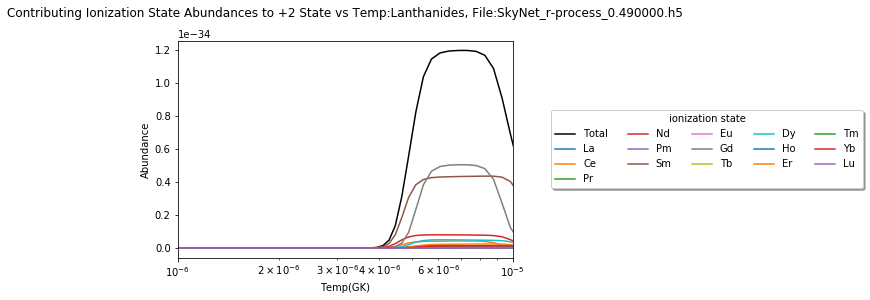

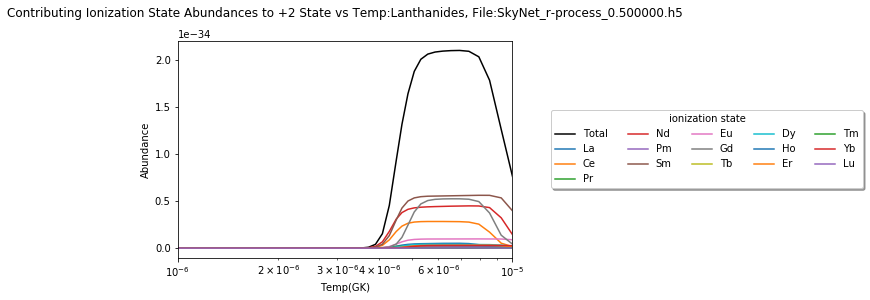

This calculation across 50 Ye datasets took: 58.65625


In [25]:
distribution_ionization(2)

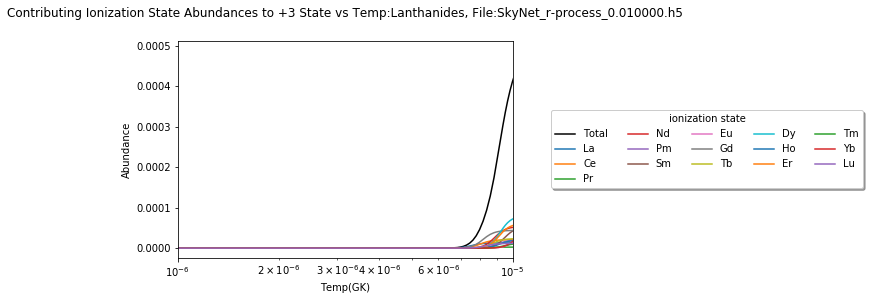

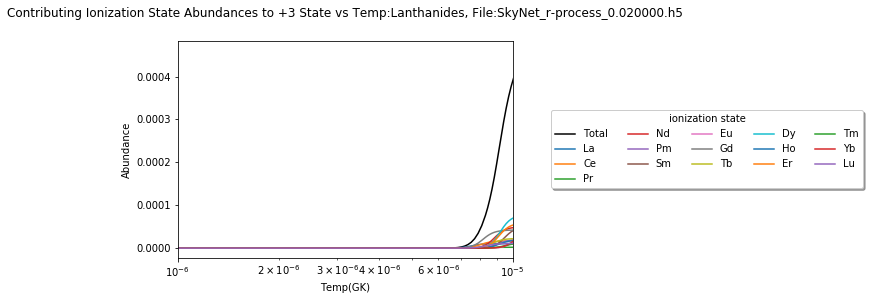

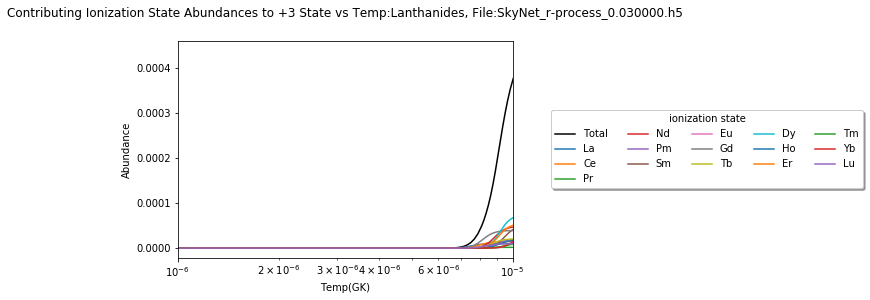

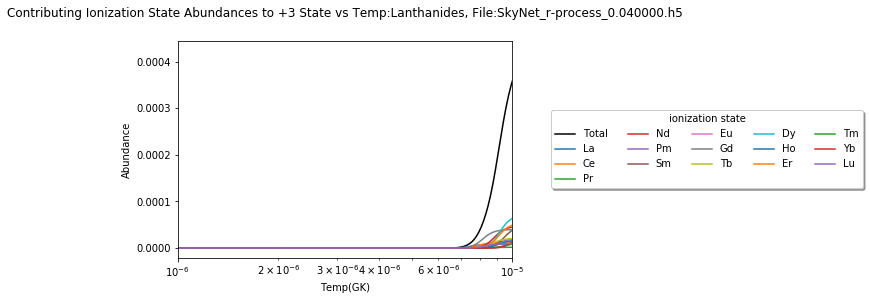

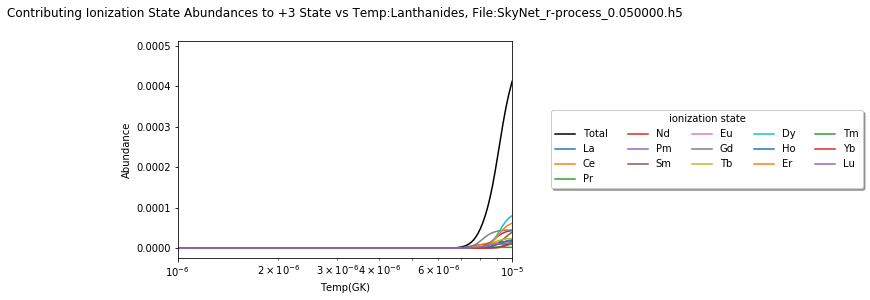

...

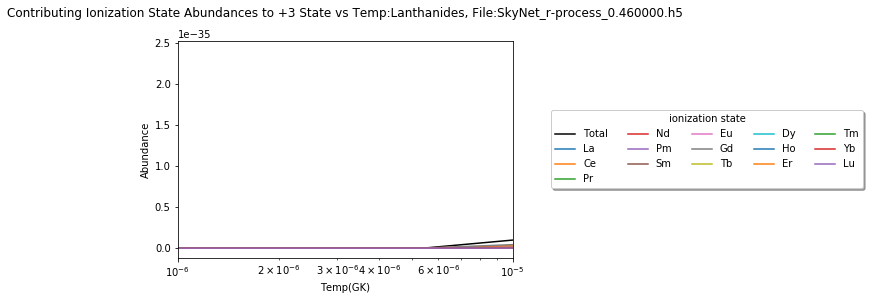

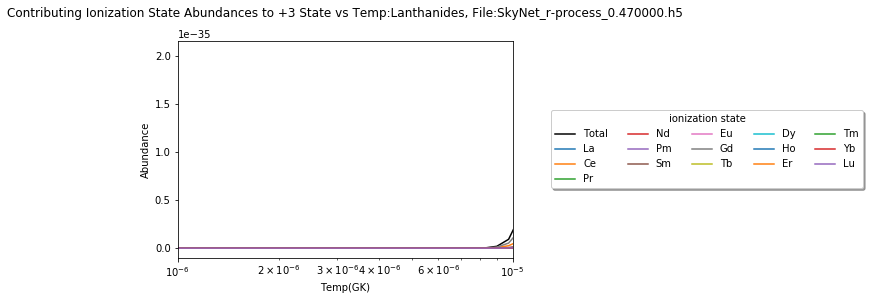

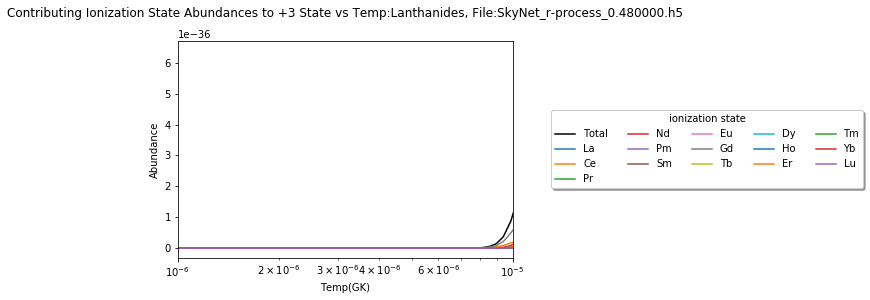

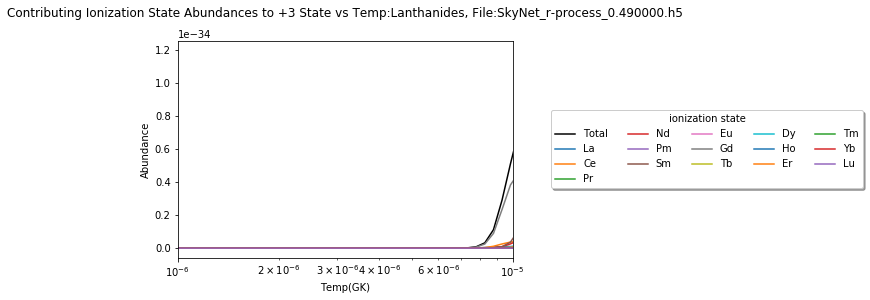

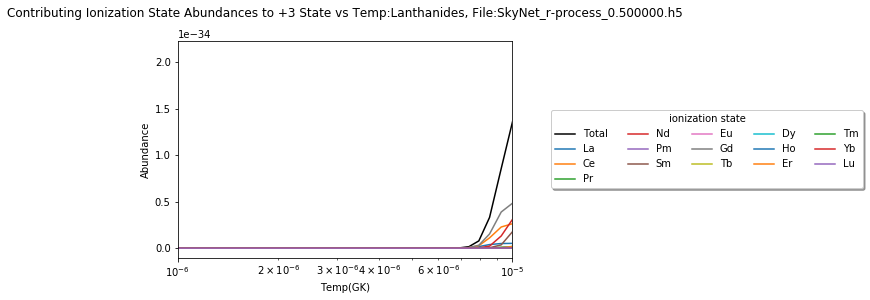

This calculation across 50 Ye datasets took: 59.515625


In [26]:
distribution_ionization(3)

In [10]:
#Calculating weighted_average function for the elemental abundances of numerous Ye files

def weighted_average(weights):
    
    def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
        array = np.array(array)
        return (np.abs(array - value)).argmin()
    
    directory_elemental = './Total_Elemental_Abundances'
    directory = './Skynet_Files'
    t_day = 86400
    t_max = 1000000000.0
    min_indices = 10000

    for file in os.listdir(directory_elemental): #this for loop is necessary for finding the smallest array, which will be my time array size
        with open(directory_elemental + '/' + file,'rb') as fp:
            Y = pickle.load(fp)
        if np.shape(Y)[1] < min_indices:
            min_indices = np.shape(Y)[1]

    averaged_elemental = np.zeros((103,min_indices))
    fiducial_times = np.linspace(0,t_max,min_indices) #create arbitrary time values based on times after 1 day. 

    for i in range(len(os.listdir(directory))):

        index_array = []
        hf = h5py.File(directory + '/' + os.listdir(directory)[i])
        time = hf['Time']
        
        with open(directory_elemental + '/' + os.listdir(directory_elemental)[i],'rb') as fp:
            Y = pickle.load(fp)

        for value in fiducial_times:
            index_array.append(find_nearest(time,value))
            
        averaged_elemental+= weights[i] * Y[:,np.array(index_array)]
    
    return averaged_elemental,fiducial_times
            
        

In [11]:
#This cell is dedicated to calculating the ionization state abundances based on a well-mixed ejecta
#Make a function for this

def temp_density_reduction(file_number,weights):
    
    directory = './Skynet_Files'
    averaged_elemental,fiducial_times = weighted_average(weights)
    index_array = []
    hf = h5py.File(directory + '/' + os.listdir(directory)[file_number-1])
    temp = np.array(temp_calculator(hf))
    density = np.array(hf['Density'])
    time = hf['Time']
    
    for value in fiducial_times:
            index_array.append(find_nearest(time,value))
    
    temp_cut = temp[np.array(index_array)]
    density_cut = density[np.array(index_array)]
    
    return temp_cut,density_cut

In [13]:
#I am calculating and then plotting the ionization state abundances using a well-mixed ejecta. These plots will show show 
#distribution of the ionization state abundances for a given state
weights = np.concatenate((np.zeros(4),.68*np.ones(34),np.zeros(12)))

averaged_elemental,fiducial_times = weighted_average(weights)
temperatures,densities = temp_density_reduction(25,weights) #For Low temp case, Ye = .25 is best, which is the 25th file

YI,bad,Ye_free,Ye_bound,Ye_f_Mid = saha_mult.GetAbundances(np.array(averaged_elemental), np.array(temperatures),np.array(densities), np.array(ionization_generator(np.arange(1,104,1))))



C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:137: RuntimeWarning: divide by zero encountered in log
  fLow = np.log(GetYefContribution(Ytot, T9, rho, lnYefLow, xi)) - lnYefLow
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:138: RuntimeWarning: divide by zero encountered in log
  fHi = np.log(GetYefContribution(Ytot, T9, rho, lnYefHi, xi)) - lnYefHi
C:\Users\prana\Documents\Research\R-process_Mergers\Abundance_Calculations\Total Charge State Abundances\saha_mult.py:149: RuntimeWarning: divide by zero encountered in log
  fMid = np.log(GetYefContribution(Ytot, T9, rho, lnYefMid, xi)) - lnYefMid


In [42]:
# I am going to calculate relative values for the abundances of numerous atoms based on electron configurations
#I will calculate rel. abundances by dividing ionization state abundance by total elemental abundance in lanthanides only!

def find_nearest(array, value): #Make sure to acknowledge this (from stack overflow)
    array = np.array(array)
    return (np.abs(array - value)).argmin()

def value_returner(input_array,minimum, maximum,num_ion_states,temp,elemental_sum):
    array = []
    for i in range(minimum,maximum):
        for j in range(len(input_array[i][0])):
            input_array[i][:,j] /= elemental_sum
            
    for i in range(minimum,maximum):
        for j in range(num_ion_states):
            array.append(input_array[i][temp,j])
    return array

directory_elemental = './Total_Elemental_Abundances'
directory_ionization = './Ionization_State_Different_Ye'
directory = './Skynet_Files'

summed_across_Ye = np.zeros(45)
Ye_vals = np.arange(.05,.39,.01)

for i in range(4,38):
    
    hf = h5py.File(directory + '/' + os.listdir(directory)[i])

    temperature = hf["Temperature"]
    time = hf['Time']   
    full_temp = temp_calculator(hf)

    temp_1000 = (find_nearest(full_temp,1e-6)) #index for when temp is approx 1000K
    temp_3000 = (find_nearest(full_temp,3e-6)) #index for when temp is approx 3000K
    temp_6000 = (find_nearest(full_temp,6e-6)) #index for when temp is approx 6000K


    with open(directory_elemental + '/' +  os.listdir(directory_elemental)[i], "rb") as fp:   # Unpickling
                elemental = pickle.load(fp)

    with open(directory_ionization + '/' +  os.listdir(directory_ionization)[i], "rb") as fp:   
            YI = pickle.load(fp)

    elemental_sum = np.sum(elemental[56:71],0) #Will divide all values by this to get rel. abundance

    #This loop will print values for a certain temp (note temp is in GK initially)
    summed_across_Ye += np.array(value_returner(YI,56,71,3,temp_6000,elemental_sum))

In [43]:
pd.DataFrame(summed_across_Ye / np.sum(Ye_vals))

,0
0,1.951390e-13
1,7.869704e-05
2,9.030404e-01
3,7.454960e-14
4,2.275220e-05
5,2.857695e-01
6,3.626318e-15
7,1.314662e-06
8,3.165933e-02
9,1.143607e-13


In [44]:
(summed_across_Ye[39] + summed_across_Ye[43]) / np.sum(Ye_vals)

0.0031293638613535775

In [45]:
(summed_across_Ye[40] + summed_across_Ye[44]) / np.sum(Ye_vals)

0.10380857413822116

My last run with this Ye code part right above this cell was to average out the values for just Ye = .05 to Ye = .38. The weight of all these Ye values  = 1.